# PREDICTING Stock Daily Return Using Machine Learning

In [106]:
#Import libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
sns.set_style('darkgrid')
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
import os
import plotly.graph_objs as go
import joblib
import itertools
from sklearn.metrics import roc_auc_score, roc_curve, explained_variance_score
from sklearn.model_selection import cross_val_score
from statsmodels.tsa.seasonal import seasonal_decompose as season
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score
from sklearn.metrics import classification_report, f1_score
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import learning_curve
from mlxtend.plotting import plot_decision_regions
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.neural_network import MLPRegressor
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from pmdarima.utils import decomposed_plot
from pmdarima.arima import decompose
from pmdarima import auto_arima
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.mixture import GaussianMixture
import missingno as msno

In [107]:
def calculate_MACD(df, nslow=26, nfast=12):
    emaslow = df.ewm(span=nslow, min_periods=nslow, adjust=True, ignore_na=False).mean()
    emafast = df.ewm(span=nfast, min_periods=nfast, adjust=True, ignore_na=False).mean()
    dif = emafast - emaslow
    MACD = dif.ewm(span=9, min_periods=9, adjust=True, ignore_na=False).mean()
    return dif, MACD


def calculate_RSI(df, periods=14):
    # wilder's RSI
    delta = df.diff()
    up, down = delta.copy(), delta.copy()
    up[up < 0] = 0
    down[down > 0] = 0 

    rUp = up.ewm(com=periods, adjust=False).mean()
    rDown = down.ewm(com=periods, adjust=False).mean().abs()

    rsi = 100 - 100 / (1 + rUp / rDown)
    return rsi


def calculate_SMA(df, periods=15):
    SMA = df.rolling(window=periods, min_periods=periods, center=False).mean()
    return SMA


def calculate_BB(df, periods=15):
    STD = df.rolling(window=periods, min_periods=periods, center=False).std()
    SMA = calculate_SMA(df)
    upper_band = SMA + (2 * STD)
    lower_band = SMA - (2 * STD)
    return upper_band, lower_band


def calculate_stdev(df, periods=5):
    STDEV = df.rolling(periods).std()
    return STDEV

### Normalizing Data

In [108]:
X = pd.read_csv('VOO-1.csv')
X['Date'] = pd.to_datetime(X['Date'])

#Sets date column as index
X = X.set_index("Date")

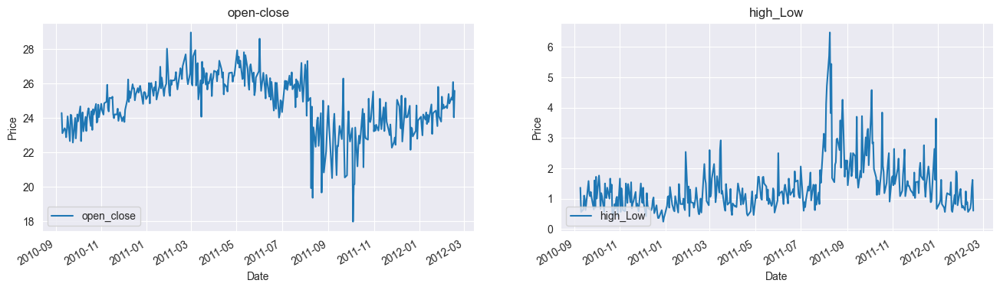

In [109]:
# Plots the difference of Open and Close and the difference of High and Low
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))
Open_Close = X.Open - X["Adj Close"]
Open_Close[:365].plot(title='open-close', label='open_close', ax = axes[0])

High_Low = X.High - X.Low
High_Low[:365].plot(title='high_Low', label='high_Low', ax = axes[1])
axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')

In [110]:
def compute_daily_returns(df):
    '''Compute and return the daily return values'''
    # TODO: Your code here
    # Note: Returned Dataframe must have the same number of rows
    daily_return = (df/df.shift(1)) - 1
    daily_return[0] = 0
    return daily_return
X['daily_returns'] = compute_daily_returns(X['Adj Close'])

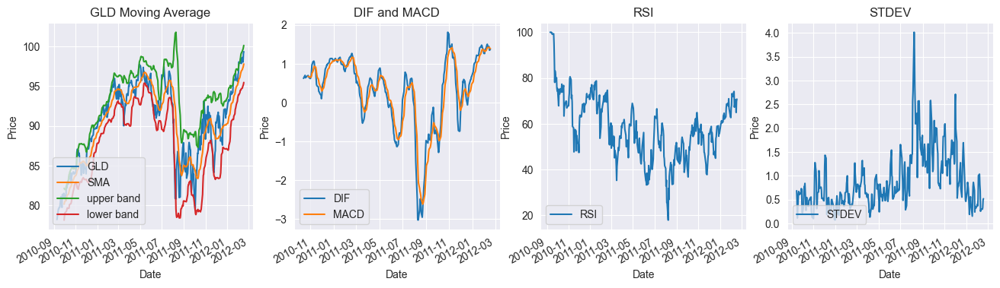

In [111]:
#Plots MACD, SMA, RSI, upper and lower bands and std of Adj Close column
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))
stock_close = X["Adj Close"]

#Calculates Simple Moving Average for Adj Close
SMA_CLOSE = calculate_SMA(stock_close)
stock_close[:365].plot(title="GLD Moving Average", label="GLD", ax=axes[0])
SMA_CLOSE[:365].plot(label="SMA", ax=axes[0])

#Calculates Bollinger Bands for Adj Close
upper_band, lower_band = calculate_BB(stock_close)
upper_band[:365].plot(label='upper band', ax = axes[0])
lower_band[:365].plot(label='lower band', ax=axes[0])

#Calculates MACD for Adj Close 
DIF, MACD = calculate_MACD(stock_close)
DIF[:365].plot(title='DIF and MACD', label='DIF', ax=axes[1])
MACD[:365].plot(label='MACD', ax=axes[1])

#Calculates RSI for Adj Close 
RSI = calculate_RSI(stock_close)
RSI[:365].plot(title='RSI', label='RSI', ax=axes[2])

#Calculates Standard deviation for Adj Close
STDEV = calculate_stdev(stock_close)
STDEV[:365].plot(title="STDEV", label='STDEV', ax=axes[3])

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')

axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')

In [112]:
X['SMA'] = SMA_CLOSE
X["Upper_band"] = upper_band
X["Lower_band"] = lower_band
X["DIF"] = DIF
X["MACD"] = MACD
X['RSI'] = RSI
X['STDEV'] = STDEV
X['Open_Close'] = Open_Close
X['High_Low'] = High_Low

#Computes daily returns 
X['daily_returns'] = compute_daily_returns(X['Adj Close'])

#Checks null values because of technical indicators
print(X.isnull().sum().to_string())
print('Total number of null values: ', X.isnull().sum().sum())

#Fills each null value in every column with mean value 
cols = list(X.columns)
for n in cols:
    X[n].fillna(X[n].mean(), inplace=True)

#Checks again null values
print(X.isnull().sum().to_string())

#Reads columns
print('Data Columns -->', list(X.columns))
print(X.head(10).to_string())

#Set target column
y=X['daily_returns']
y = np.array([1 if i>0 else 0 for i in y])

#Drops irrelevant column
X = X.drop(['daily_returns'], axis=1)
print(y[:10])

#Resample data using SMOTE
# sm = SMOTE(random_state=2022)
# X,y = sm.fit_resample(X, y)

#Splits the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2021, stratify=y)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print(X_train.tail(1))
print(X_test.tail(1))
print(y_train[-1])
print(y_test[-1])
print(X.tail(1))

Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
daily_returns     0
SMA              14
Upper_band       14
Lower_band       14
DIF              25
MACD             33
RSI               1
STDEV             4
Open_Close        0
High_Low          0
Total number of null values:  105
Open             0
High             0
Low              0
Close            0
Adj Close        0
Volume           0
daily_returns    0
SMA              0
Upper_band       0
Lower_band       0
DIF              0
MACD             0
RSI              0
STDEV            0
Open_Close       0
High_Low         0
Data Columns --> ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'daily_returns', 'SMA', 'Upper_band', 'Lower_band', 'DIF', 'MACD', 'RSI', 'STDEV', 'Open_Close', 'High_Low']
                  Open        High         Low       Close  Adj Close  Volume  daily_returns         SMA  Upper_band  Lower_band       DIF      MACD         RSI

In [113]:
# Normalises data with robust scaler 
rob_scaler = RobustScaler()
X_train_rob = X_train.copy()
X_test_rob = X_test.copy()
y_train_rob = y_train.copy()
y_test_rob = y_test.copy()
X_train_rob = rob_scaler.fit_transform(X_train_rob)
X_test_rob = rob_scaler.transform(X_test_rob)

#Normalises data with minmax scaler
norm = MinMaxScaler()
X_train_norm = X_train.copy()
X_test_norm = X_test.copy()
y_train_norm = y_train.copy()
y_test_norm = y_test.copy()
X_train_norm = norm.fit_transform(X_train_norm)
X_test_norm = norm.transform(X_test_norm)

#Normalises data with standard scaler 
std_scaler = StandardScaler()
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()
y_train_stand = y_train.copy()
y_test_stand = y_test.copy()
X_train_stand = std_scaler.fit_transform(X_train_stand)
X_test_stand = std_scaler.transform(X_test_stand)

### Learning Curve 

In [114]:
def plot_learning_curve(estimator, name, X, y, axes=None, ylim=None, cv=None, train_sizes=np.linspace(.1, 1.0, 5), fc=""):
    if axes is None:
        _, axes = plt.subplots(1,3, figsize=(20, 5))

    axes[0].set_title(name + " with " + fc)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel('Training examples')
    axes[0].set_ylabel('Score')

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X, y, cv=cv, train_sizes=train_sizes, return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    #Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color='r', label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color='g', label="Cross-validation score")
    axes[0].legend(loc='best')

    #Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std, fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model :" + name + " with " + fc)

    #Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel('fit_times')
    axes[2].set_ylabel('Score')
    axes[2].set_title('Performance of  the model: ' + name + " with " + fc)

    return plt    

### Real Values vs Predicted Values Diagram and Confusion Matrix

In [115]:
def plot_real_pred_val(Y_test, ypred, name, fc, ax):
    acc=accuracy_score(Y_test, ypred)
    ax.scatter(range(len(ypred)),ypred, color='blue', lw=5, label='Predicted')
    ax.scatter(range(len(Y_test)), Y_test, color='red', label="Actual")
    ax.set_title("Predicted Values vs True Values of " + name + " with " + fc, fontsize=30)
    ax.set_xlabel("Accuracy: " + str(round((acc*100), 3)) + "%", fontsize=20)
    ax.set_ylabel("Daily Returns", fontsize=20)
    ax.legend(fontsize=20)
    ax.grid(True, alpha=0.75, lw=1, ls='-.')
    ax.yaxis.set_ticklabels(["", "Negative Daily Returns", "", "", "", "", "Positive Daily Returns"]);
    # plt.show()
    return acc


def plot_cm(Y_test, ypred, name, fc, ax):
    cm = confusion_matrix(Y_test, ypred)
    sns.heatmap(cm, annot=True, linewidth=0.7,linecolor='red', fmt='g', cmap='Greens', ax=ax)
    ax.set_title(name + " Confusion Matrix " + "with " + fc)
    ax.set_xlabel('Y predict')
    ax.set_ylabel('Y test')
    ax.xaxis.set_ticklabels(["Negative Daily Returns", "Positive Daily Returns"])
    ax.yaxis.set_ticklabels(["Negative Daily Returns", "Positive Daily Returns"]);
    #plt.show()
    return cm

### Decision Boundaries and ROC

In [116]:
def plot_decision_boundary(model, xtest, ytest, name, fc, ax):
    #Trains model with two features 
    model.fit(xtest, ytest)
    plot_decision_regions(np.array(xtest), np.array(ytest), clf=model, legend=2, ax=ax)
    ax.set_title("Decision boundary for " + name + " (Test) " + "with " + fc)
    ax.set_xlabel('Open_Close')
    ax.set_ylabel('High_Low')
    plt.show()


#Plots ROC
def plot_roc(model, X_test, y_test, name, fc, ax):
    Y_pred_prob = model.predict_proba(X_test)
    Y_pred_prob = Y_pred_prob[:, 1]

    fpr, tpr, thresholds = roc_curve(y_test, Y_pred_prob)
    ax.plot([0,1], [0,1], color='navy', lw=5, linestyle='--')
    ax.plot(fpr, tpr, label='ANN')
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("ROC Curve of " + name + " with " + fc)
    plt.grid(True)
    #plt.show()

#Chooses two features for decision boundary 
X_feature = X.iloc[:, 13:14]
X_train_feat, X_test_feat, y_train_feat, y_test_feat = train_test_split(X_feature, y, test_size=0.3, random_state=2021, stratify=y)

### Training Model and Predicting Stock Daily Returns

In [117]:
def train_model(model, X, y):
    model.fit(X,y)
    return model


def predict_model(model, X, proba=False):
    if ~proba:
        y_pred = model.predict(X)
    else:
        y_pred_proba = model.predict_proba(X)
        y_pred = np.argmax(y_pred_proba, axis=1)

    return y_pred

list_scores = []


def run_model(name, model, X_train, X_test, y_train, y_test, fc, proba=False):
    print(name)
    print(fc)

    model = train_model(model, X_train, y_train)
    y_pred = predict_model(model, X_test, proba)


    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    
    print('accuracy: ', accuracy)
    print('recall: ', recall)
    print('precision: ', precision)
    print('f1: ', f1)
    print(classification_report(y_test, y_pred))
    fig, axes = plt.subplots(2, 2, figsize=(30, 20), facecolor='#fbe7dd')
    plot_cm(y_test, y_pred, name, fc, axes[0, 0])
    plot_real_pred_val(y_test, y_pred, name, fc, axes[0, 1])
    plot_roc(model, X_test, y_test, name, fc, axes[1, 0])
    plot_decision_boundary(model, X_test_feat, y_test_feat, name, fc, axes[1, 1])
    plot_learning_curve(model, name, X_train, y_train, cv=3, fc=fc);
    plt.show()

    list_scores.append({'Model Name': name, 'Feature Scaling': fc, 'Accuracy': accuracy, 'Recall': recall, 'Precision': precision, 'F1': f1})

feature_scaling = {
    'Robust Scaler': (X_train_rob, X_test_rob, y_train_rob, y_test_rob), 
    'MinMax Scaler': (X_train_norm, X_test_norm, y_train_norm, y_test_norm),
    'Standard Scaler': (X_train_stand, X_test_stand, y_train_stand, y_test_stand)
}


In [118]:
def next_day_prediction(model, X, y, train_window=None):
    if train_window is None:
        # Train on all available data
        X_train = X[:-1]
        y_train = y[:-1]
    else:
        # Train on the last 'train_window' days
        X_train = X[-train_window:]
        y_train = y[-train_window:]
    
    # Train the model
    model = train_model(model, X_train, y_train)
    
    # Predict for the next day (i.e., day after the last available day)
    next_day_pred = model.predict(X[-1:])  # Last row for the next day prediction
    return next_day_pred[0]

    

### Support Vector Classifier

SVC
Robust Scaler
accuracy:  0.7418439716312056
recall:  0.7418439716312056
precision:  0.7426804873613385
f1:  0.7392919122178011
              precision    recall  f1-score   support

           0       0.75      0.65      0.69       320
           1       0.74      0.82      0.78       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.74       705
weighted avg       0.74      0.74      0.74       705



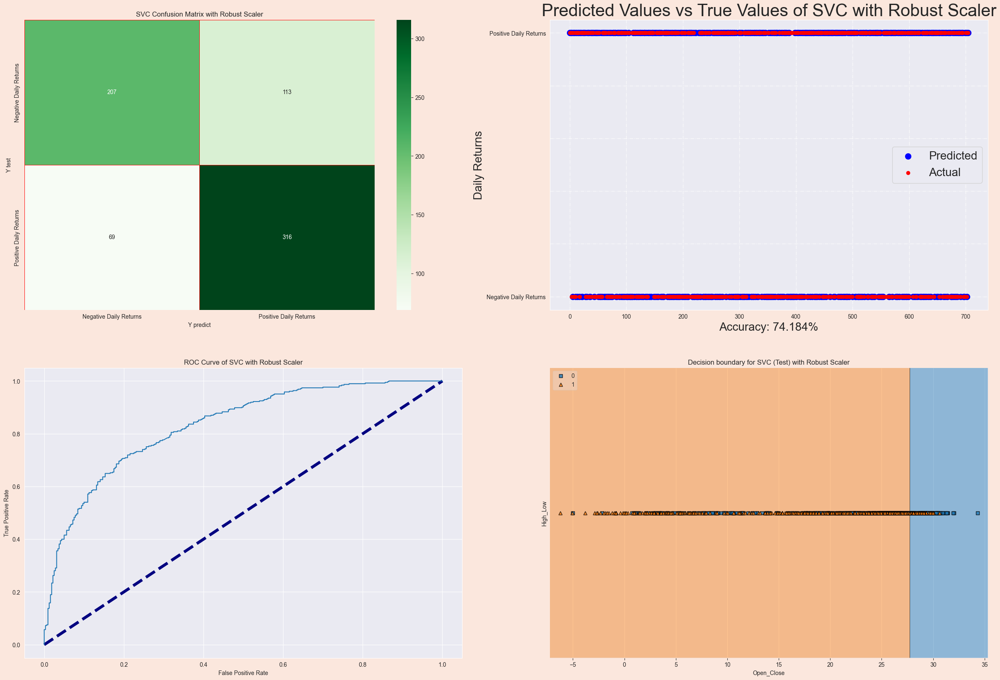

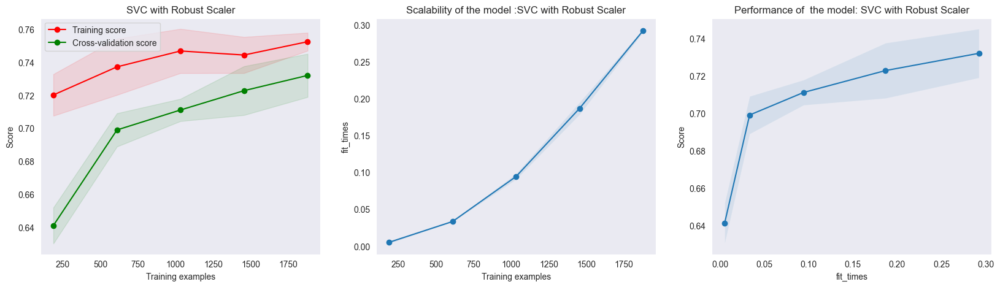

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
SVC
MinMax Scaler
accuracy:  0.7078014184397163
recall:  0.7078014184397163
precision:  0.7138415387900025
f1:  0.7000992857614851
              precision    recall  f1-score   support

           0       0.74      0.55      0.63       320
           1       0.69      0.84      0.76       385

    accuracy                           0.71       705
   macro avg       0.72      0.69      0.69       705
weighted avg       0.71      0.71      0.70       705



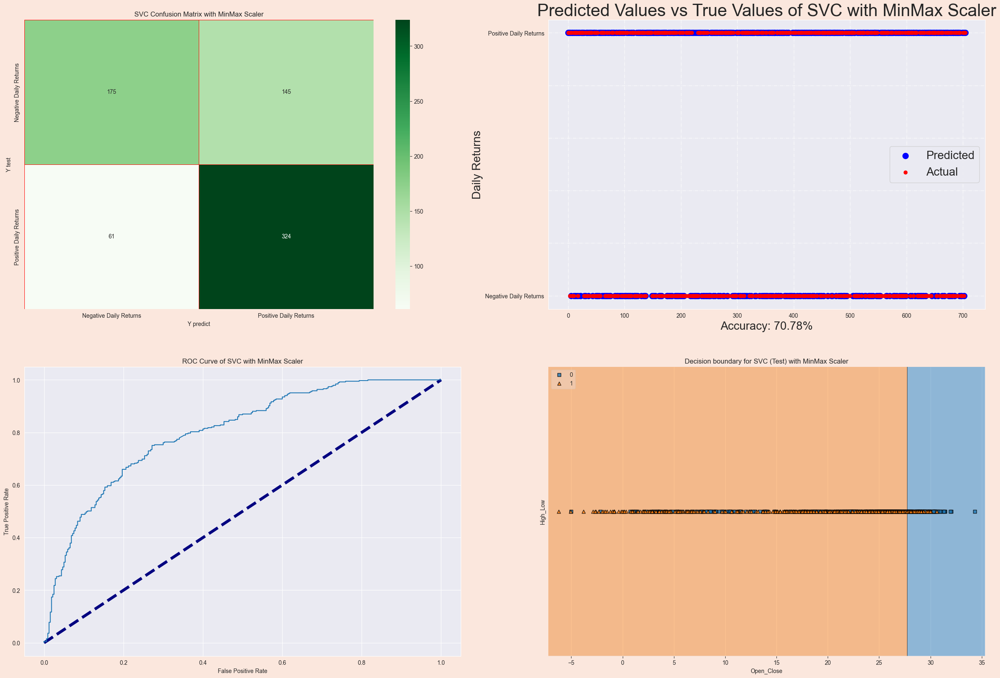

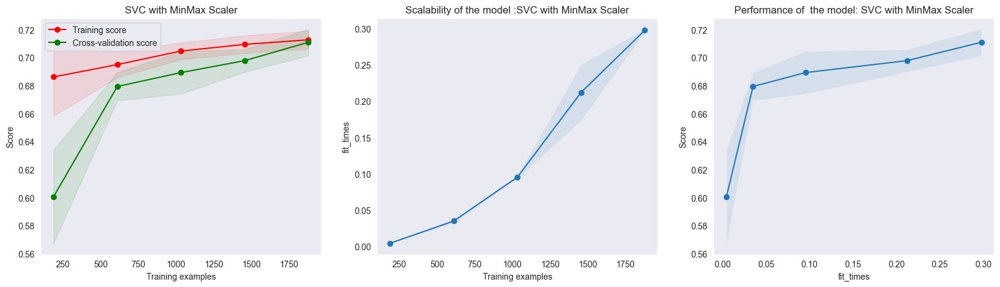

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 1
SVC
Standard Scaler
accuracy:  0.7375886524822695
recall:  0.7375886524822695
precision:  0.7391491490256662
f1:  0.7343783029108227
              precision    recall  f1-score   support

           0       0.75      0.63      0.69       320
           1       0.73      0.83      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.73       705



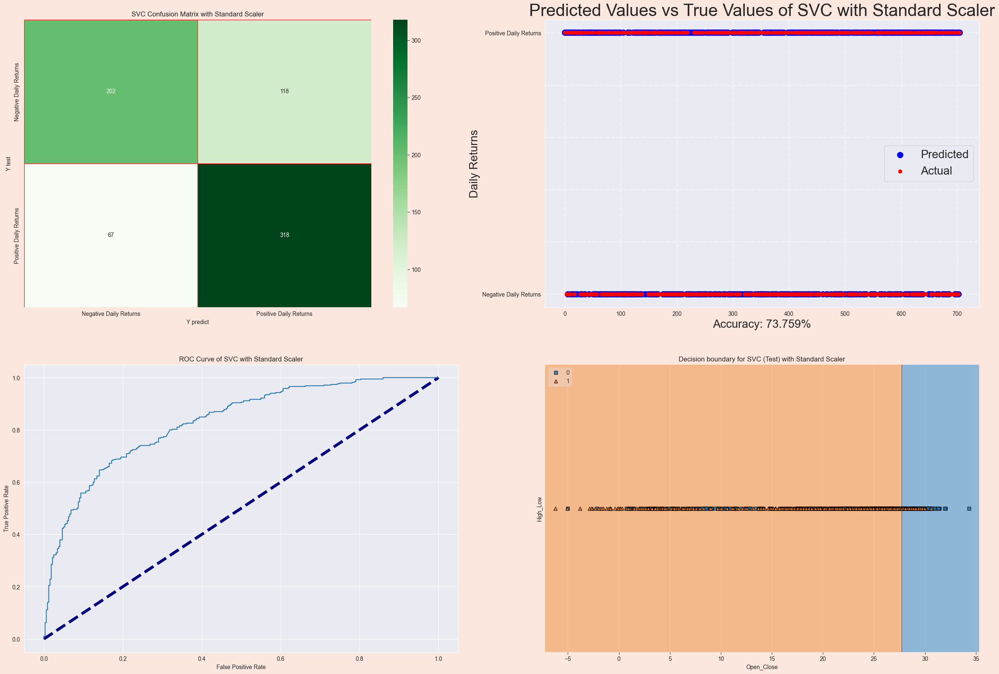

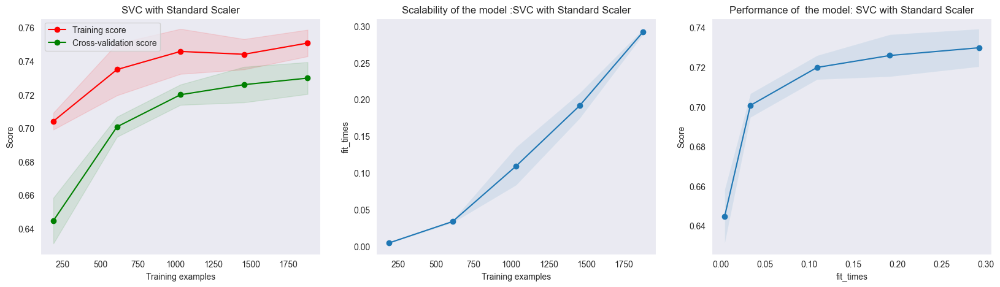

Feature Scaling: Standard Scaler - Prediction for tomorrow: 1


In [119]:
# Train and test models using different feature scaling methods
model_svc = SVC(random_state=2021, probability=True)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    # Run the model training and evaluation
    run_model('SVC', model_svc, X_train, X_test, y_train, y_test, fc_name)

    # Now predict for tomorrow using the same scaling method (last row of the respective scaled data)
    # The last row of X is scaled in the same way as the training data
    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(model_svc, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Logistic Regression Classifier

LogisticRegression
Robust Scaler
accuracy:  0.6921985815602837
recall:  0.6921985815602837
precision:  0.6921109963787966
f1:  0.6884329282791813
              precision    recall  f1-score   support

           0       0.69      0.58      0.63       320
           1       0.69      0.78      0.74       385

    accuracy                           0.69       705
   macro avg       0.69      0.68      0.68       705
weighted avg       0.69      0.69      0.69       705



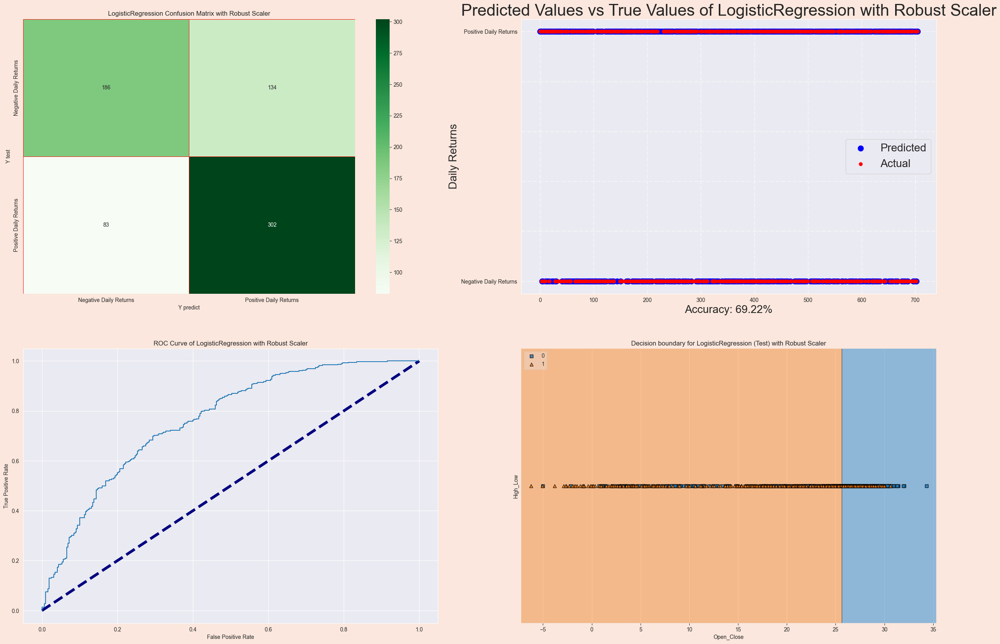

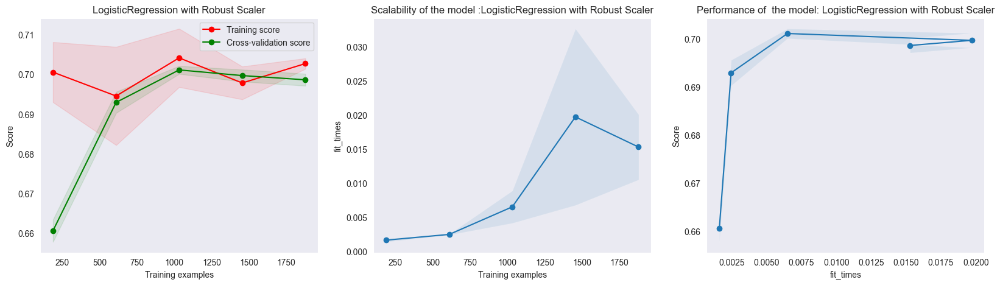

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
LogisticRegression
MinMax Scaler
accuracy:  0.6822695035460993
recall:  0.6822695035460993
precision:  0.6830150531520005
f1:  0.676808907483942
              precision    recall  f1-score   support

           0       0.69      0.55      0.61       320
           1       0.68      0.79      0.73       385

    accuracy                           0.68       705
   macro avg       0.68      0.67      0.67       705
weighted avg       0.68      0.68      0.68       705



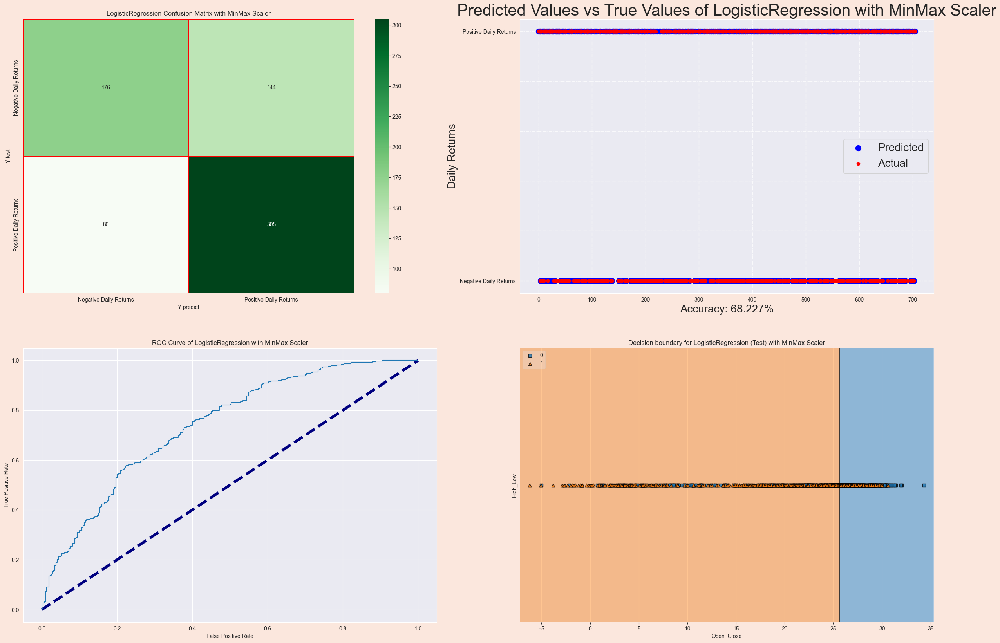

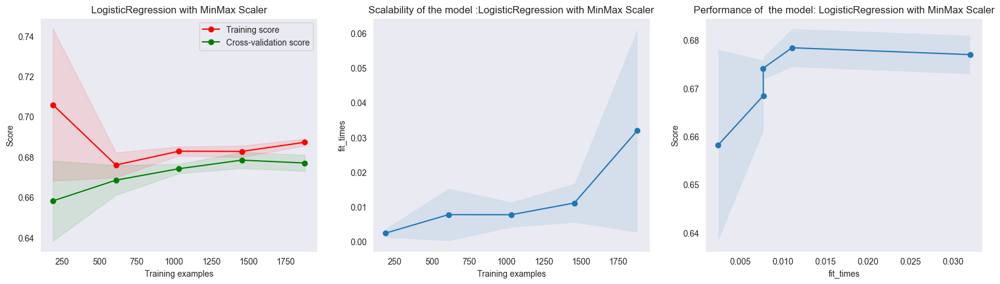

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 1
LogisticRegression
Standard Scaler
accuracy:  0.700709219858156
recall:  0.700709219858156
precision:  0.7011219217016328
f1:  0.6968347411487203
              precision    recall  f1-score   support

           0       0.70      0.59      0.64       320
           1       0.70      0.79      0.74       385

    accuracy                           0.70       705
   macro avg       0.70      0.69      0.69       705
weighted avg       0.70      0.70      0.70       705



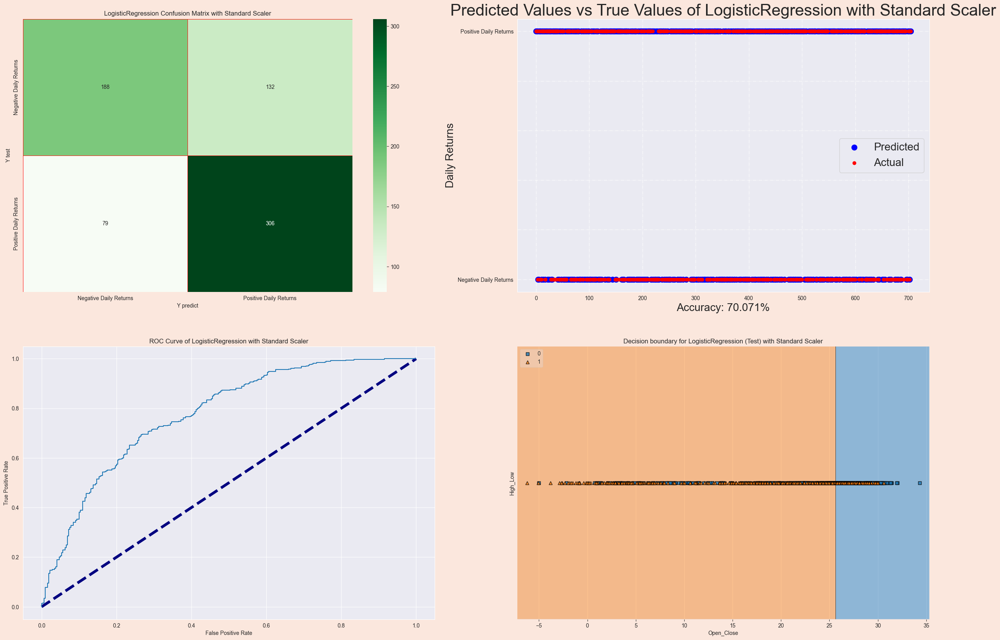

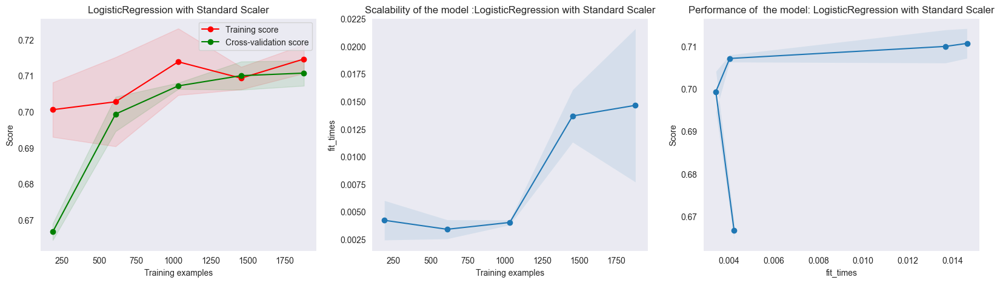

Feature Scaling: Standard Scaler - Prediction for tomorrow: 1


In [120]:
# Train and test models using different feature scaling methods
logreg = LogisticRegression(solver='lbfgs', max_iter=5000, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    # Run the model training and evaluation
    run_model('LogisticRegression', logreg, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(logreg, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### K-Nearest Neighbors Classifier

KNeighborsClassifier n_neighbors = 5
Robust Scaler
accuracy:  0.6907801418439716
recall:  0.6907801418439716
precision:  0.6896870837017752
f1:  0.6891313947502605
              precision    recall  f1-score   support

           0       0.67      0.62      0.64       320
           1       0.70      0.75      0.73       385

    accuracy                           0.69       705
   macro avg       0.69      0.68      0.69       705
weighted avg       0.69      0.69      0.69       705



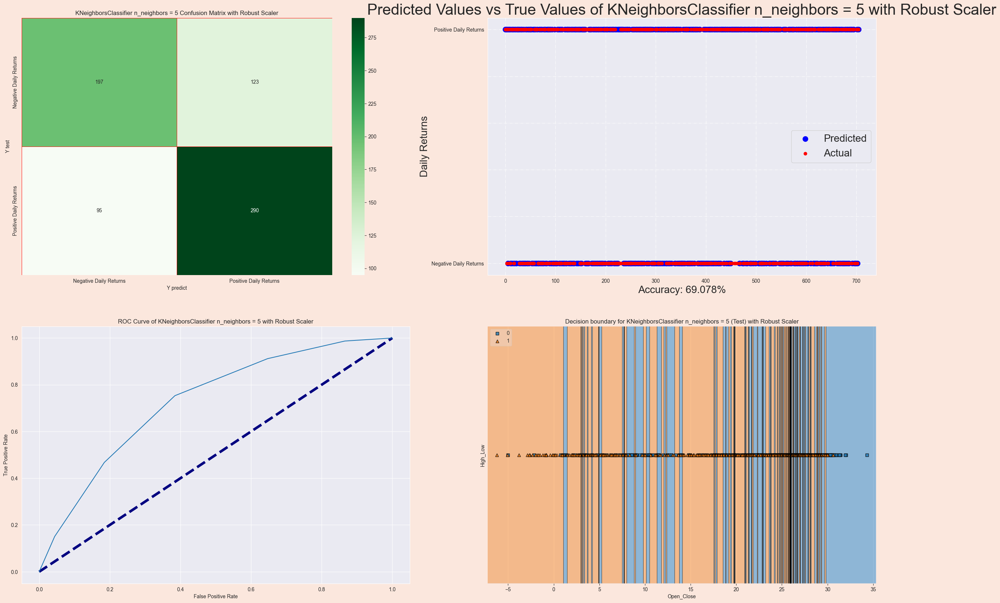

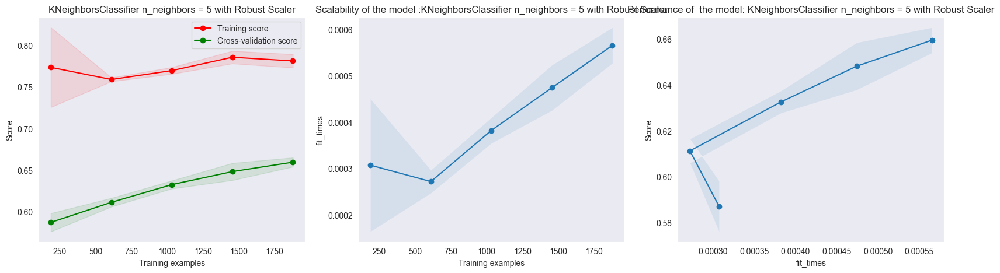

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
KNeighborsClassifier n_neighbors = 9
MinMax Scaler
accuracy:  0.7177304964539007
recall:  0.7177304964539007
precision:  0.7188027498416254
f1:  0.7140763672445278
              precision    recall  f1-score   support

           0       0.73      0.61      0.66       320
           1       0.71      0.81      0.76       385

    accuracy                           0.72       705
   macro avg       0.72      0.71      0.71       705
weighted avg       0.72      0.72      0.71       705



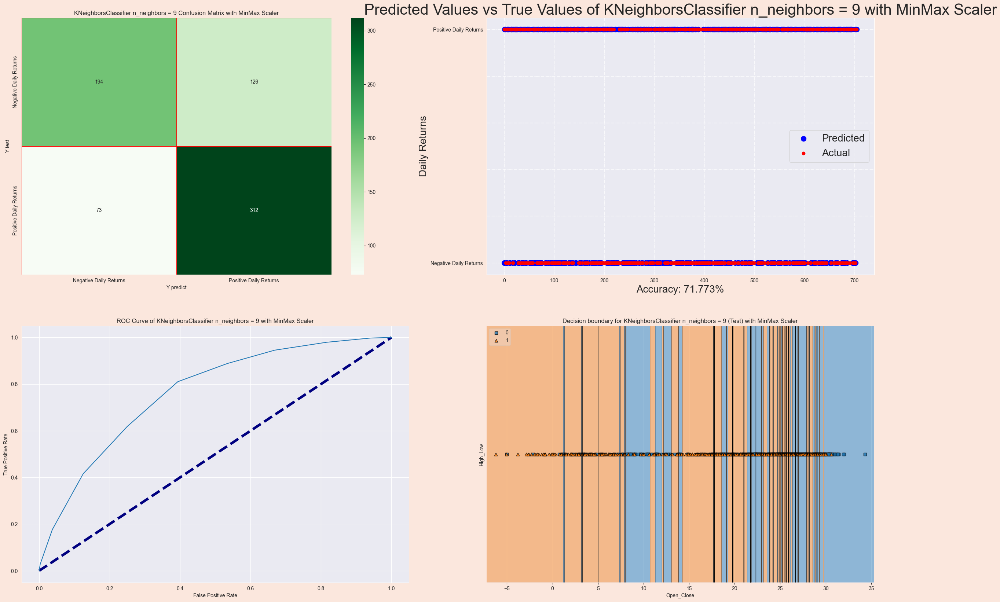

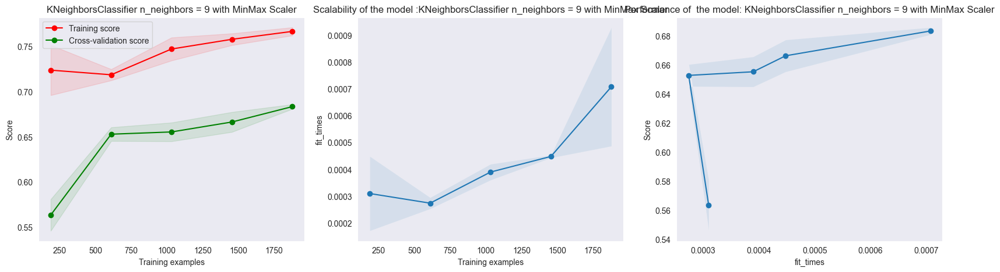

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
KNeighborsClassifier n_neighbors = 9
Standard Scaler
accuracy:  0.6964539007092199
recall:  0.6964539007092199
precision:  0.69613123432025
f1:  0.6932562658991528
              precision    recall  f1-score   support

           0       0.69      0.59      0.64       320
           1       0.70      0.78      0.74       385

    accuracy                           0.70       705
   macro avg       0.70      0.69      0.69       705
weighted avg       0.70      0.70      0.69       705



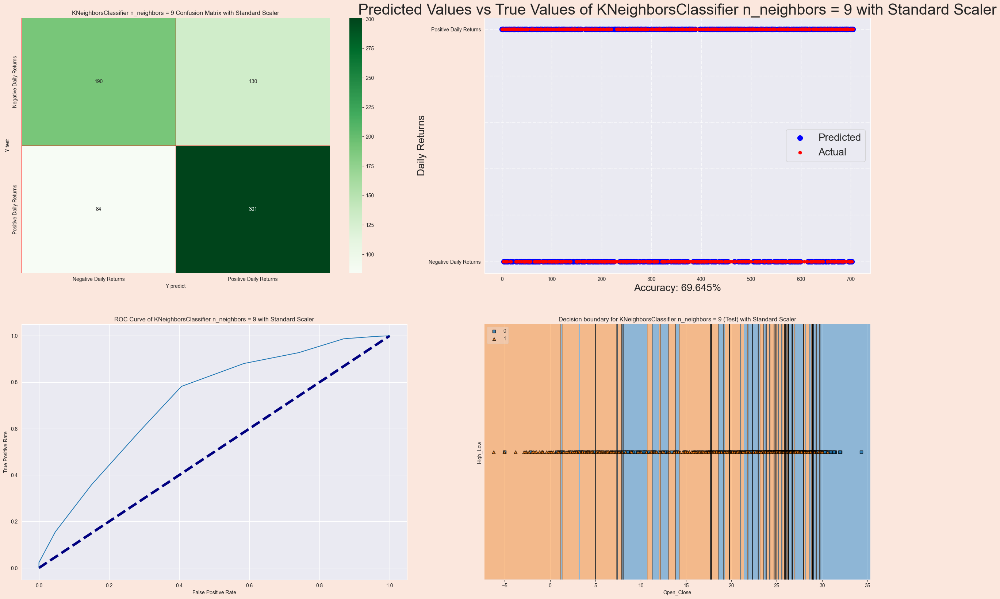

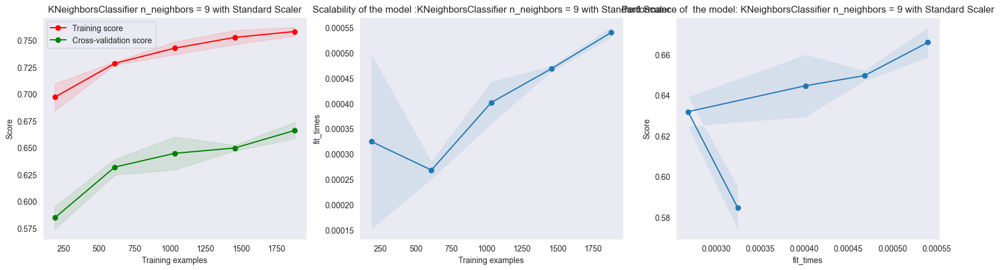

Feature Scaling: Standard Scaler - Prediction for tomorrow: 0


In [121]:
for fc_name, value in feature_scaling.items():
    scores_1 = []
    X_train, X_test, y_train, y_test = value

    for i in range(2,10):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(X_train, y_train)

        scores_1.append(accuracy_score(y_test, knn.predict(X_test)))

    max_val = max(scores_1)
    max_index = np.argmax(scores_1) + 2

    knn = KNeighborsClassifier(n_neighbors= max_index)
    knn.fit(X_train, y_train)

    run_model(f'KNeighborsClassifier n_neighbors = {max_index}', knn, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(knn, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Decision Tree Classifier

DecisionTreeClassifier
Robust Scaler
accuracy:  0.6539007092198581
recall:  0.6539007092198581
precision:  0.6527403765013621
f1:  0.6487770469764994
              precision    recall  f1-score   support

           0       0.65      0.53      0.58       320
           1       0.66      0.76      0.71       385

    accuracy                           0.65       705
   macro avg       0.65      0.64      0.64       705
weighted avg       0.65      0.65      0.65       705



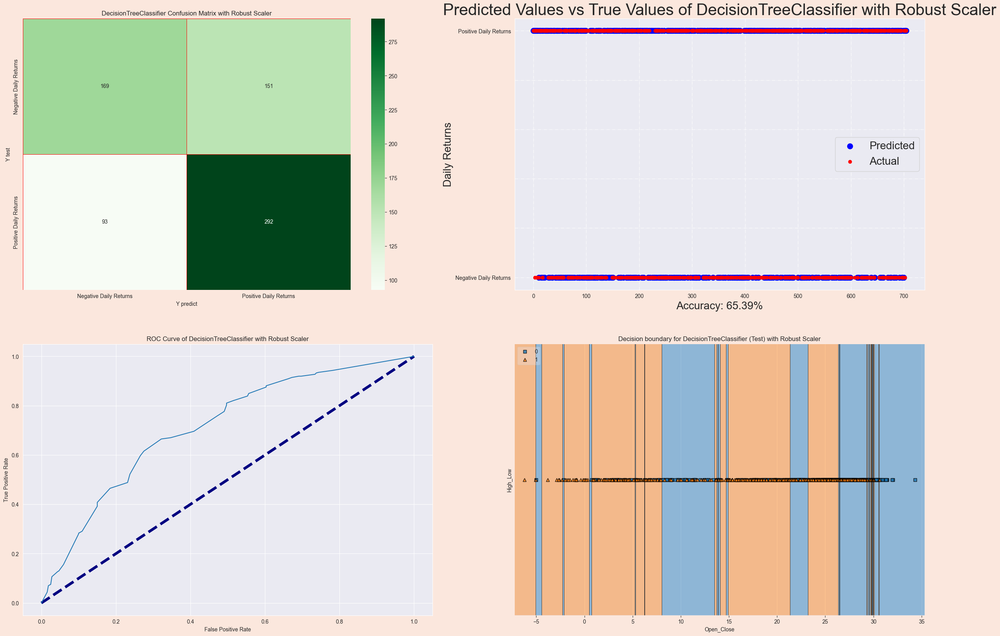

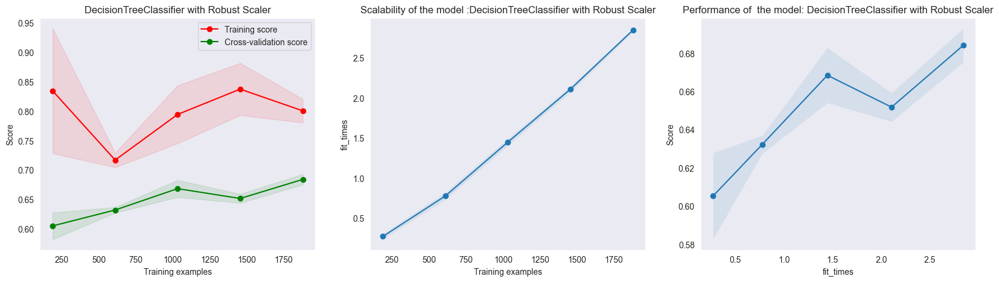

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
DecisionTreeClassifier
MinMax Scaler
accuracy:  0.6539007092198581
recall:  0.6539007092198581
precision:  0.6527403765013621
f1:  0.6487770469764994
              precision    recall  f1-score   support

           0       0.65      0.53      0.58       320
           1       0.66      0.76      0.71       385

    accuracy                           0.65       705
   macro avg       0.65      0.64      0.64       705
weighted avg       0.65      0.65      0.65       705



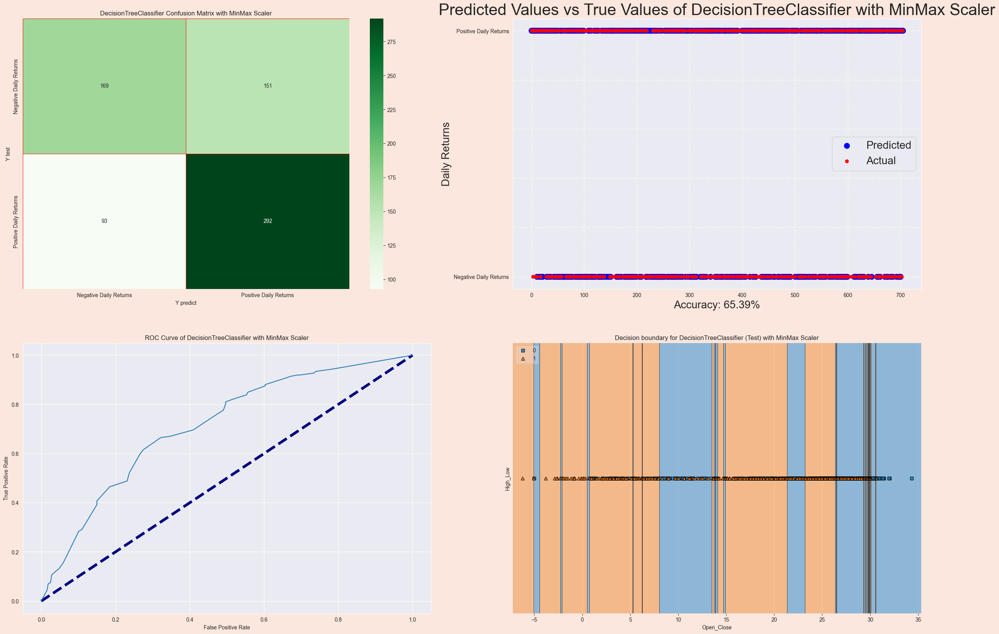

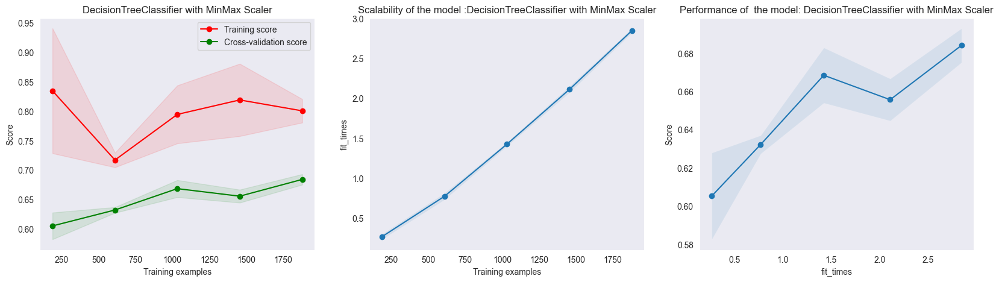

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
DecisionTreeClassifier
Standard Scaler
accuracy:  0.6539007092198581
recall:  0.6539007092198581
precision:  0.6527403765013621
f1:  0.6487770469764994
              precision    recall  f1-score   support

           0       0.65      0.53      0.58       320
           1       0.66      0.76      0.71       385

    accuracy                           0.65       705
   macro avg       0.65      0.64      0.64       705
weighted avg       0.65      0.65      0.65       705



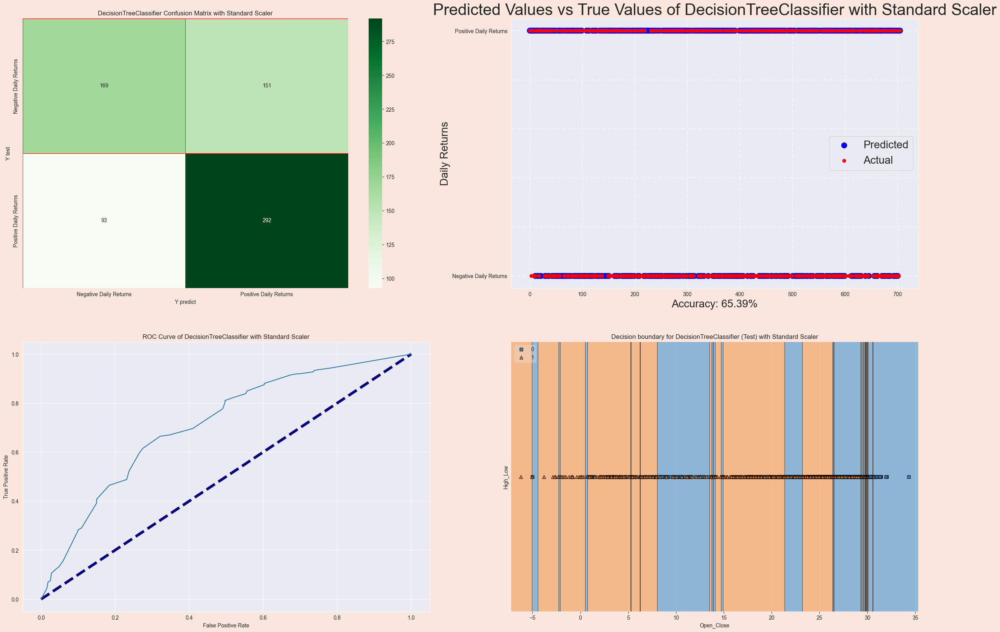

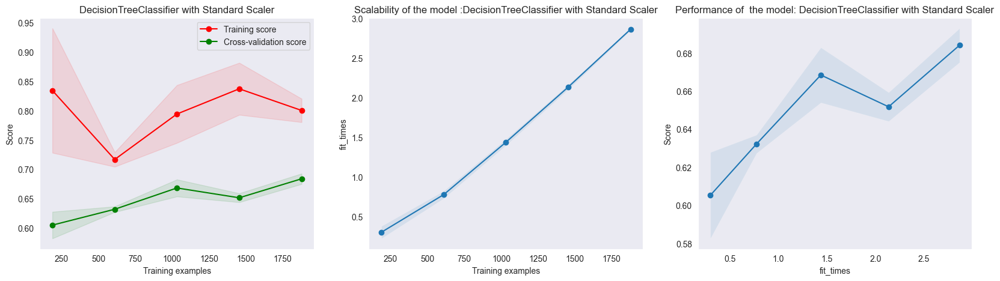

Feature Scaling: Standard Scaler - Prediction for tomorrow: 1


In [122]:
for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    dt_cla = DecisionTreeClassifier()
    parameters = {'max_depth': np.arange(1,51,1), 'random_state': [2021]}
    searcher = GridSearchCV(dt_cla, parameters)

    # Run the model training and evaluation
    run_model('DecisionTreeClassifier', searcher, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(dt_cla, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Random Forest Classifier

RandomForestClassifier
Robust Scaler
accuracy:  0.7375886524822695
recall:  0.7375886524822695
precision:  0.7378300910561532
f1:  0.7353995929923549
              precision    recall  f1-score   support

           0       0.74      0.65      0.69       320
           1       0.74      0.81      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705



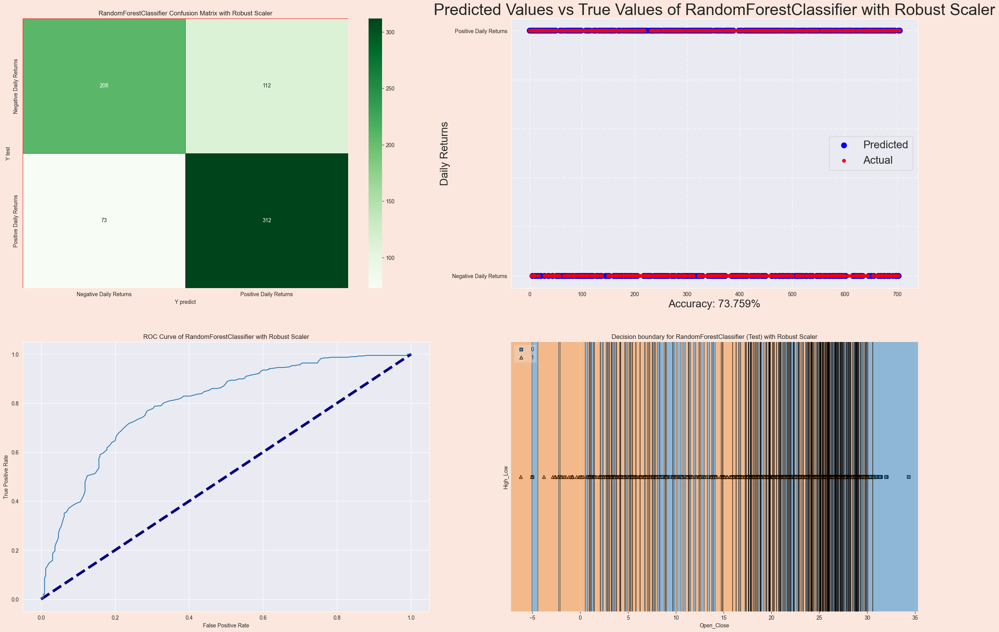

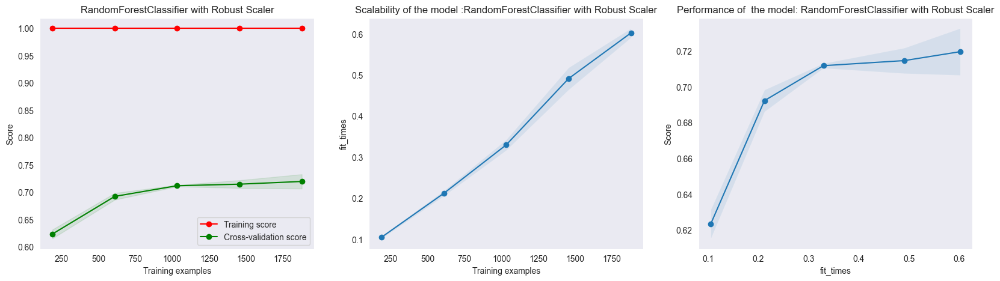

Feature Scaling: Robust Scaler - Prediction for tomorrow: 0
RandomForestClassifier
MinMax Scaler
accuracy:  0.7390070921985815
recall:  0.7390070921985815
precision:  0.7391982294653187
f1:  0.7369069839761244
              precision    recall  f1-score   support

           0       0.74      0.65      0.69       320
           1       0.74      0.81      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705



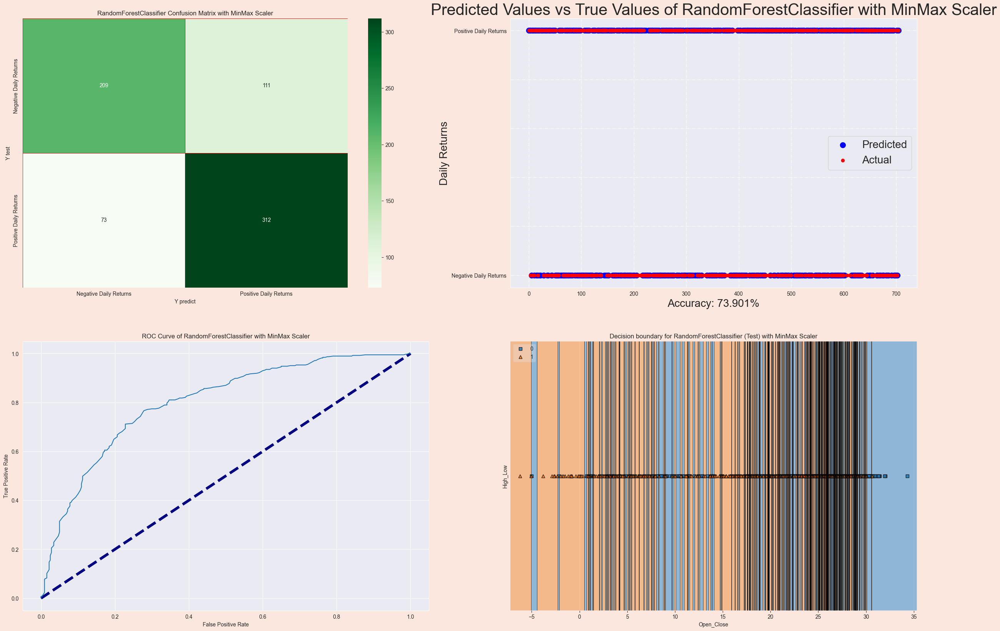

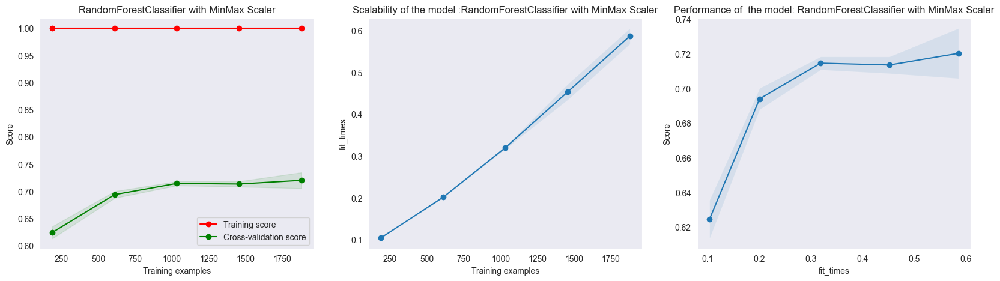

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
RandomForestClassifier
Standard Scaler
accuracy:  0.7375886524822695
recall:  0.7375886524822695
precision:  0.7378300910561532
f1:  0.7353995929923549
              precision    recall  f1-score   support

           0       0.74      0.65      0.69       320
           1       0.74      0.81      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705



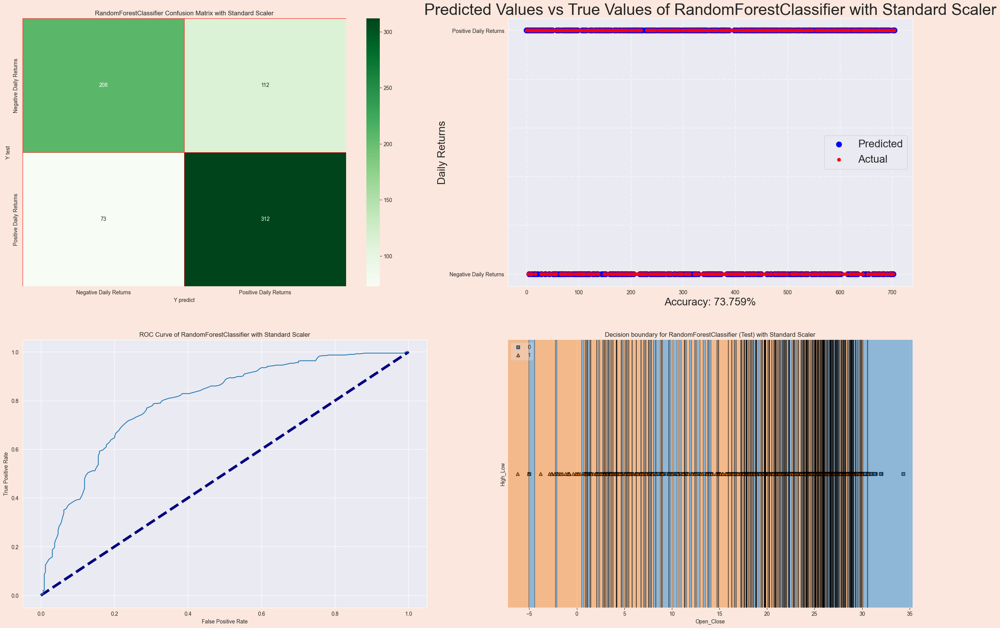

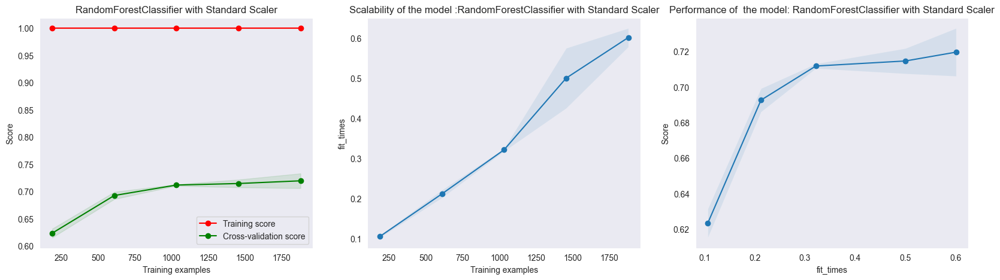

Feature Scaling: Standard Scaler - Prediction for tomorrow: 0


In [123]:
# Train and test models using different feature scaling methods
rf = RandomForestClassifier(n_estimators=200, max_depth=50, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    # Run the model training and evaluation
    run_model('RandomForestClassifier', rf, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(rf, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Gradient Boosting Classifier

GradientBoostingClassifier
Robust Scaler
accuracy:  0.7375886524822695
recall:  0.7375886524822695
precision:  0.7372887395065855
f1:  0.7359877468609858
              precision    recall  f1-score   support

           0       0.73      0.66      0.70       320
           1       0.74      0.80      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705



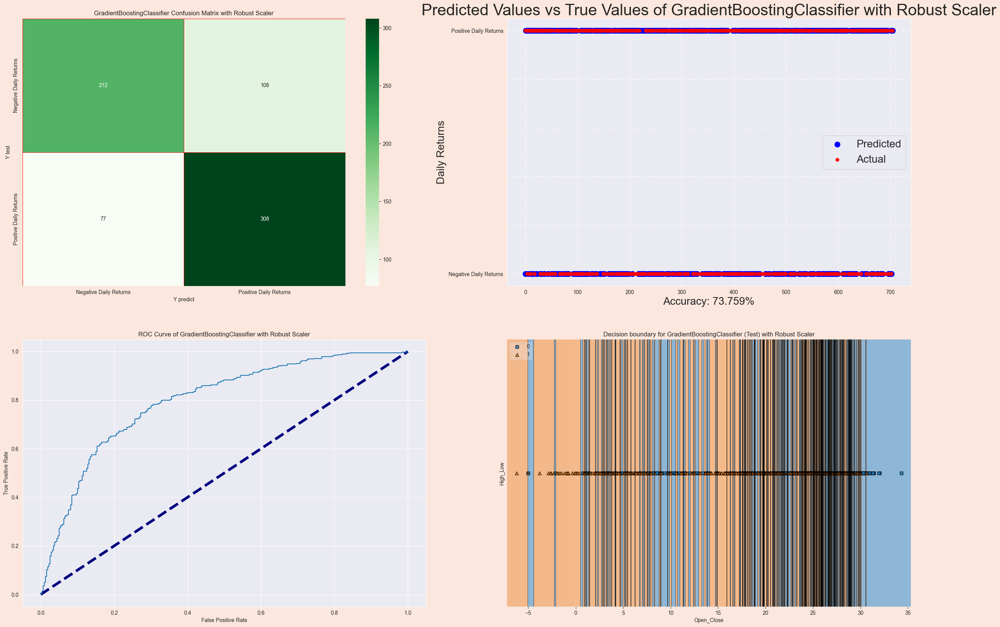

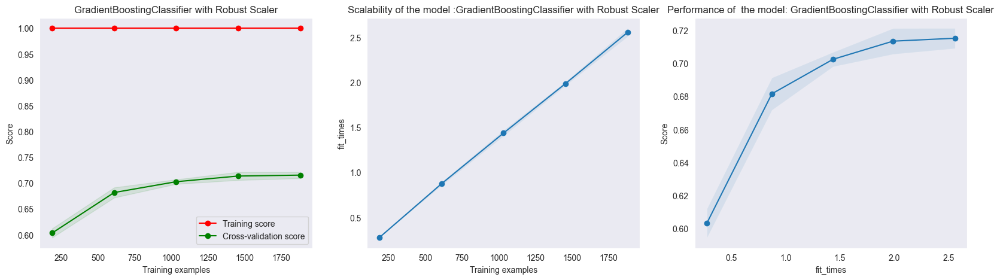

Feature Scaling: Robust Scaler - Prediction for tomorrow: 0
GradientBoostingClassifier
MinMax Scaler
accuracy:  0.7390070921985815
recall:  0.7390070921985815
precision:  0.7385190655441137
f1:  0.7377436307139227
              precision    recall  f1-score   support

           0       0.73      0.67      0.70       320
           1       0.74      0.79      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705



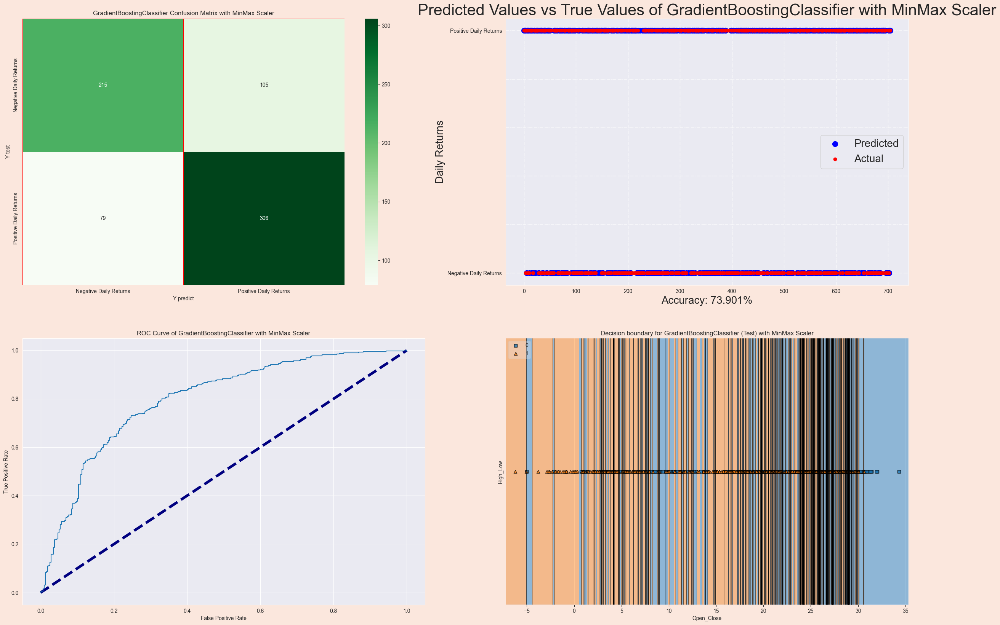

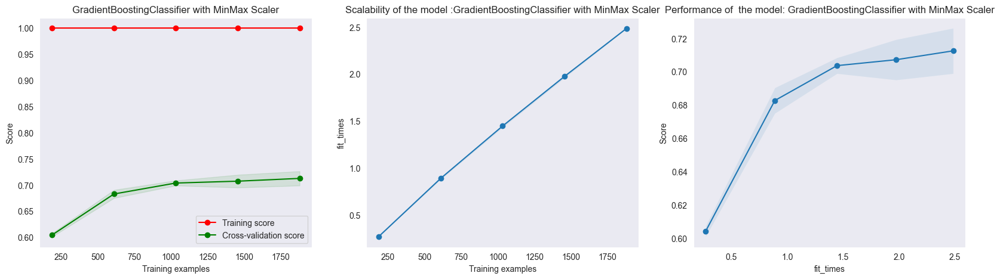

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
GradientBoostingClassifier
Standard Scaler
accuracy:  0.7319148936170212
recall:  0.7319148936170212
precision:  0.7313666752913291
f1:  0.7305518634032807
              precision    recall  f1-score   support

           0       0.72      0.66      0.69       320
           1       0.74      0.79      0.76       385

    accuracy                           0.73       705
   macro avg       0.73      0.73      0.73       705
weighted avg       0.73      0.73      0.73       705



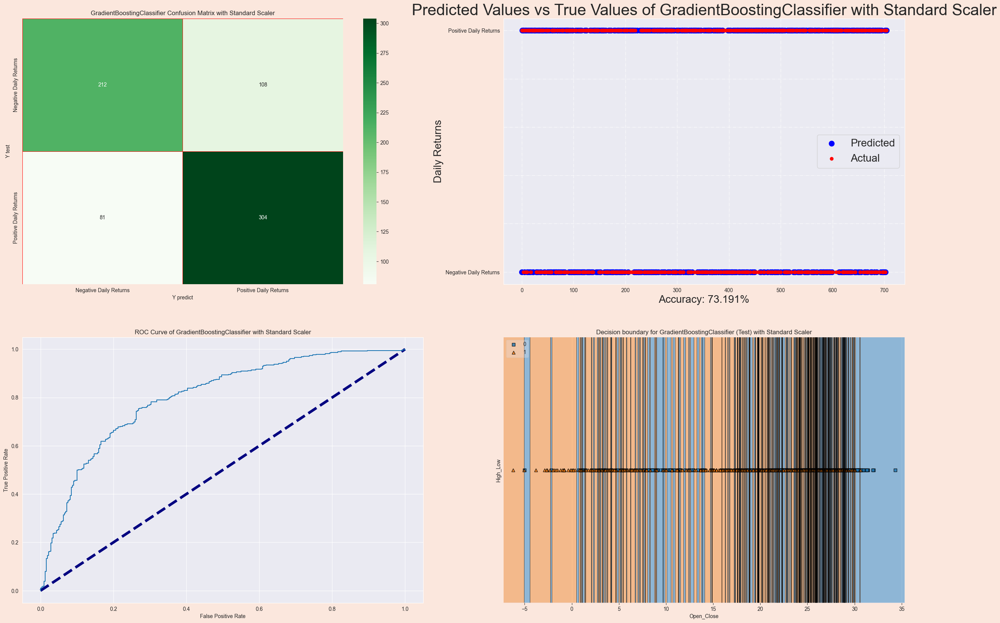

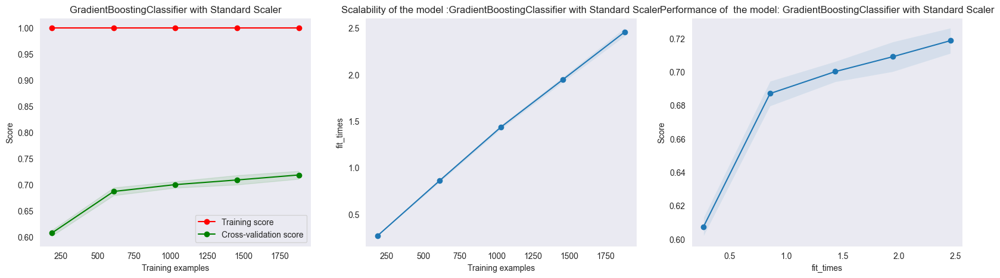

Feature Scaling: Standard Scaler - Prediction for tomorrow: 0


In [124]:
# Train and test models using different feature scaling methods
gbt = GradientBoostingClassifier(n_estimators=200, max_depth=20, subsample=0.8, max_features=0.2, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value
    # Run the model training and evaluation
    run_model('GradientBoostingClassifier', gbt, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(gbt, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Extreme Gradient Boosting Classifier

XGBClassifier
Robust Scaler
accuracy:  0.7574468085106383
recall:  0.7574468085106383
precision:  0.7571783614336807
f1:  0.7572743043358428
              precision    recall  f1-score   support

           0       0.74      0.72      0.73       320
           1       0.77      0.78      0.78       385

    accuracy                           0.76       705
   macro avg       0.76      0.75      0.76       705
weighted avg       0.76      0.76      0.76       705



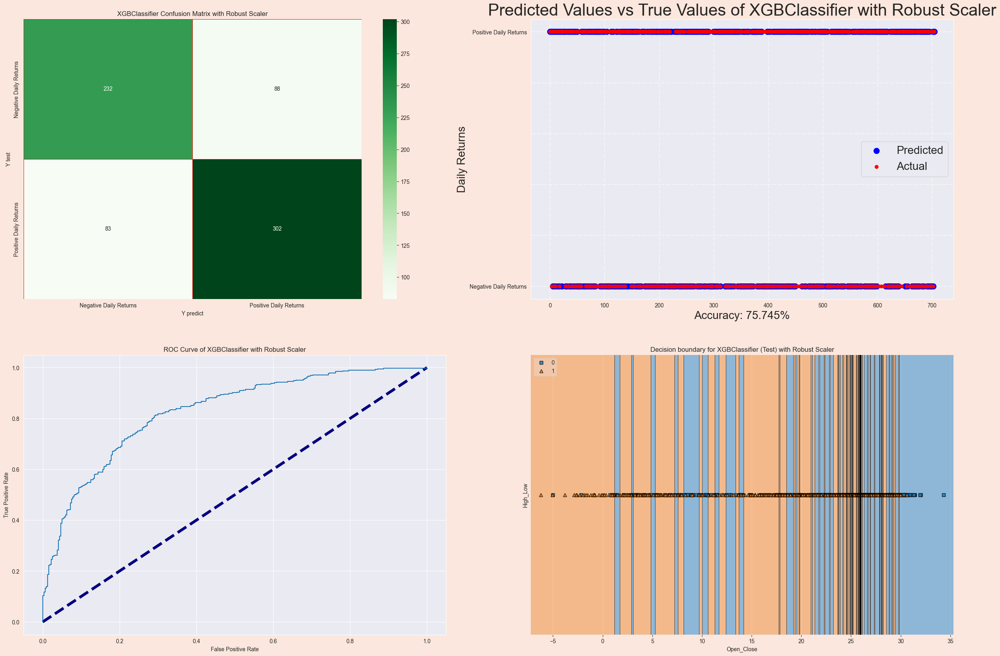

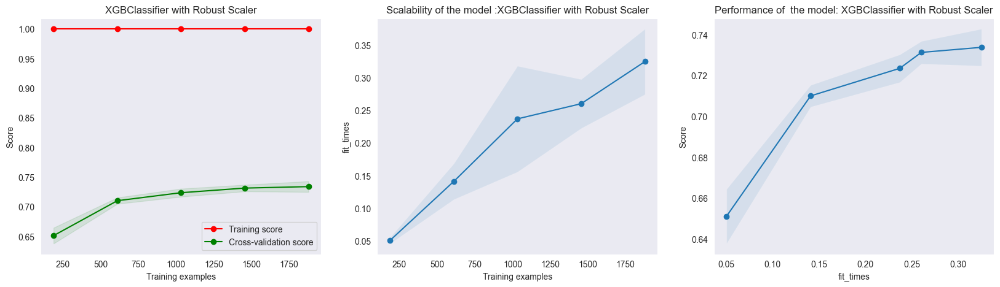

Feature Scaling: Robust Scaler - Prediction for tomorrow: 0
XGBClassifier
MinMax Scaler
accuracy:  0.7574468085106383
recall:  0.7574468085106383
precision:  0.7571783614336807
f1:  0.7572743043358428
              precision    recall  f1-score   support

           0       0.74      0.72      0.73       320
           1       0.77      0.78      0.78       385

    accuracy                           0.76       705
   macro avg       0.76      0.75      0.76       705
weighted avg       0.76      0.76      0.76       705



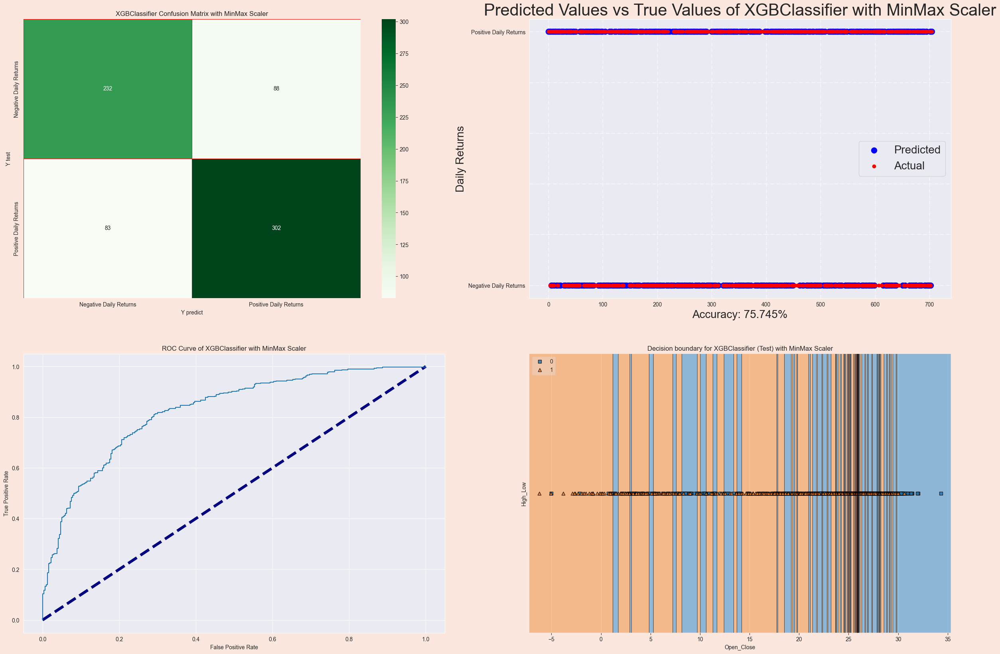

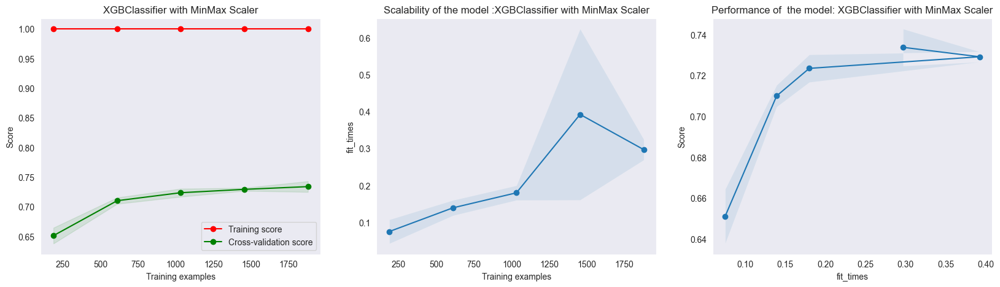

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
XGBClassifier
Standard Scaler
accuracy:  0.7574468085106383
recall:  0.7574468085106383
precision:  0.7571783614336807
f1:  0.7572743043358428
              precision    recall  f1-score   support

           0       0.74      0.72      0.73       320
           1       0.77      0.78      0.78       385

    accuracy                           0.76       705
   macro avg       0.76      0.75      0.76       705
weighted avg       0.76      0.76      0.76       705



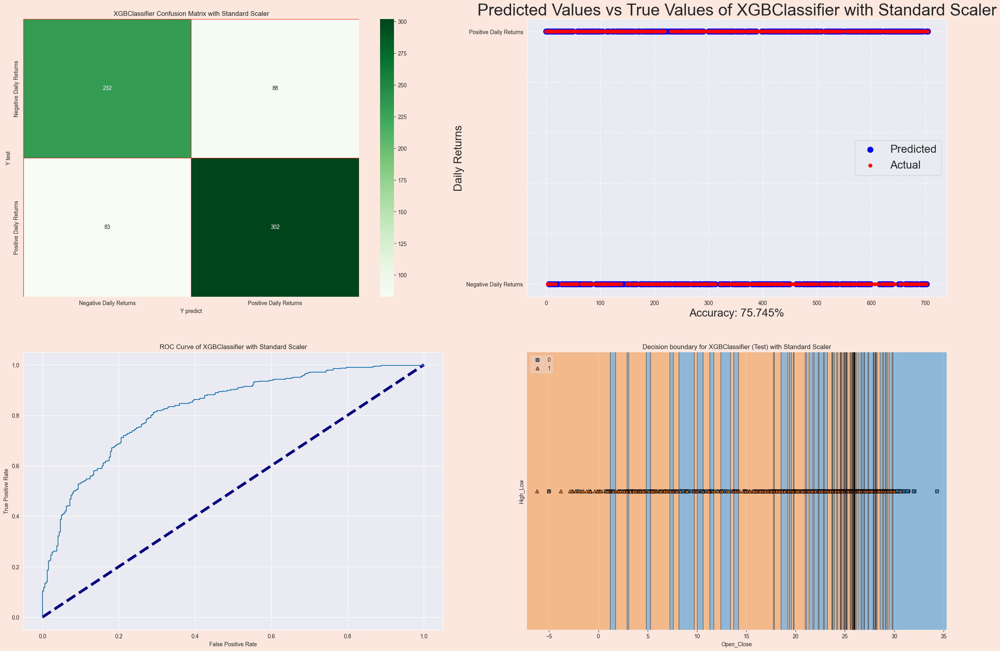

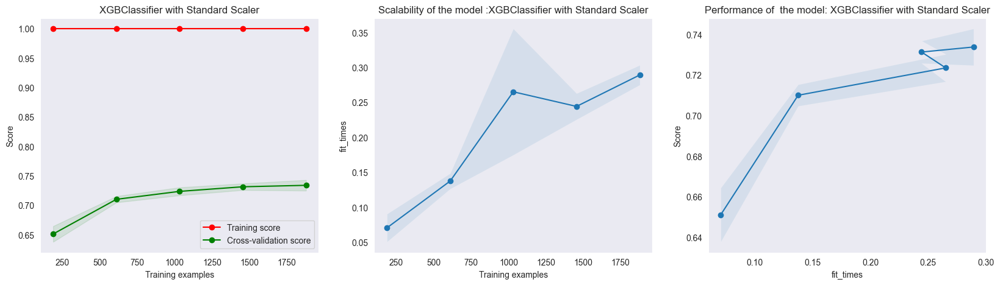

Feature Scaling: Standard Scaler - Prediction for tomorrow: 0


In [125]:
# Train and test models using different feature scaling methods
xgb = XGBClassifier(n_estimators = 200, max_depth=20, random_state=2021, use_label_encoder=False, eval_metric='mlogloss')

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    # Run the model training and evaluation
    run_model('XGBClassifier', xgb, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(xgb, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Multi - Layer Perceptron Classifier

MLPClassifier
Robust Scaler
accuracy:  0.7702127659574468
recall:  0.7702127659574468
precision:  0.7697902104726425
f1:  0.7696949318779921
              precision    recall  f1-score   support

           0       0.76      0.72      0.74       320
           1       0.78      0.81      0.79       385

    accuracy                           0.77       705
   macro avg       0.77      0.77      0.77       705
weighted avg       0.77      0.77      0.77       705



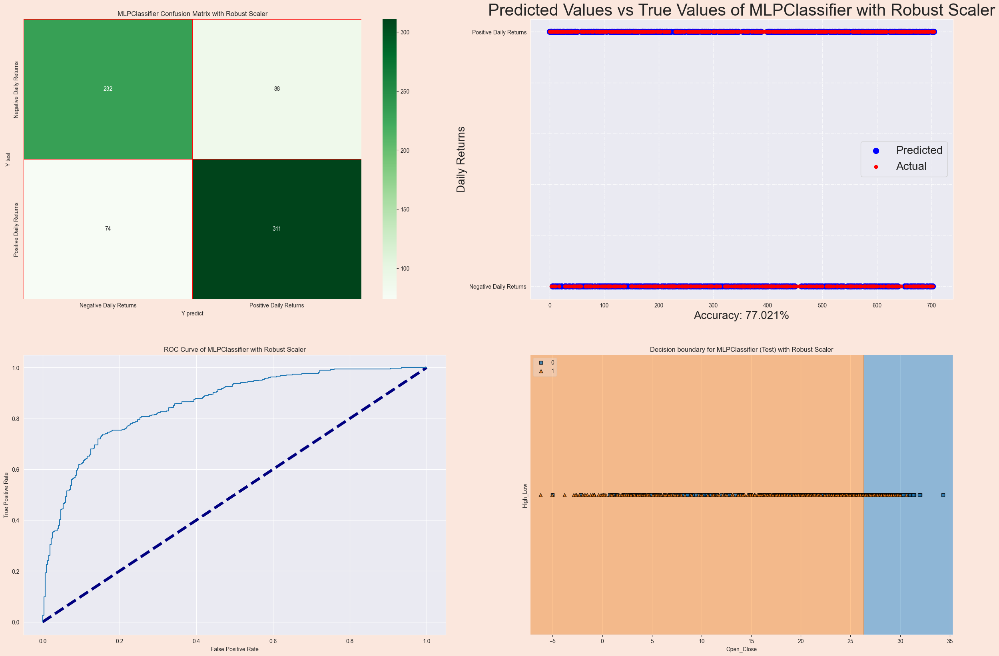

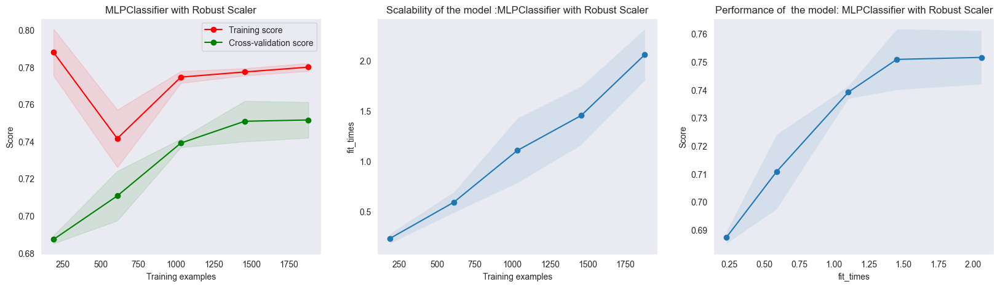

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
MLPClassifier
MinMax Scaler
accuracy:  0.7078014184397163
recall:  0.7078014184397163
precision:  0.7071945325699924
f1:  0.7056190403265723
              precision    recall  f1-score   support

           0       0.70      0.62      0.66       320
           1       0.71      0.78      0.74       385

    accuracy                           0.71       705
   macro avg       0.71      0.70      0.70       705
weighted avg       0.71      0.71      0.71       705



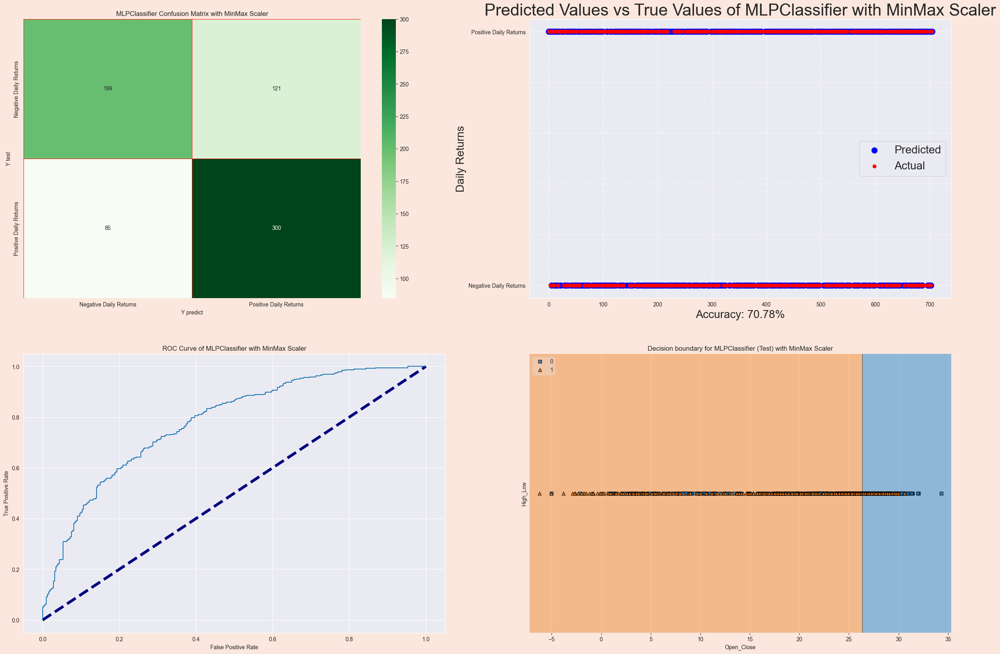

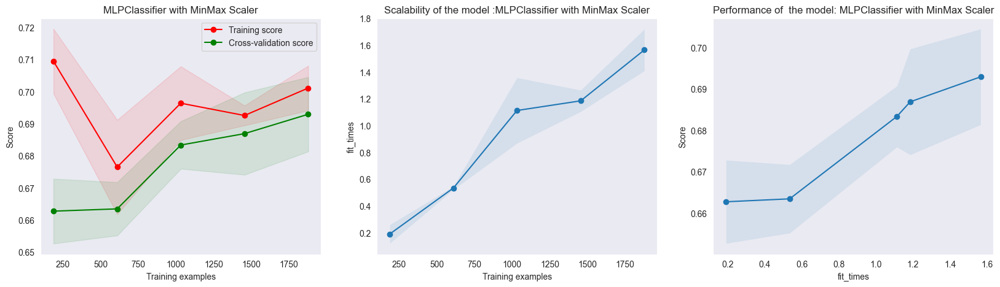

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 1
MLPClassifier
Standard Scaler
accuracy:  0.7687943262411348
recall:  0.7687943262411348
precision:  0.7687369029095664
f1:  0.7676188028292843
              precision    recall  f1-score   support

           0       0.77      0.70      0.73       320
           1       0.77      0.82      0.80       385

    accuracy                           0.77       705
   macro avg       0.77      0.76      0.76       705
weighted avg       0.77      0.77      0.77       705



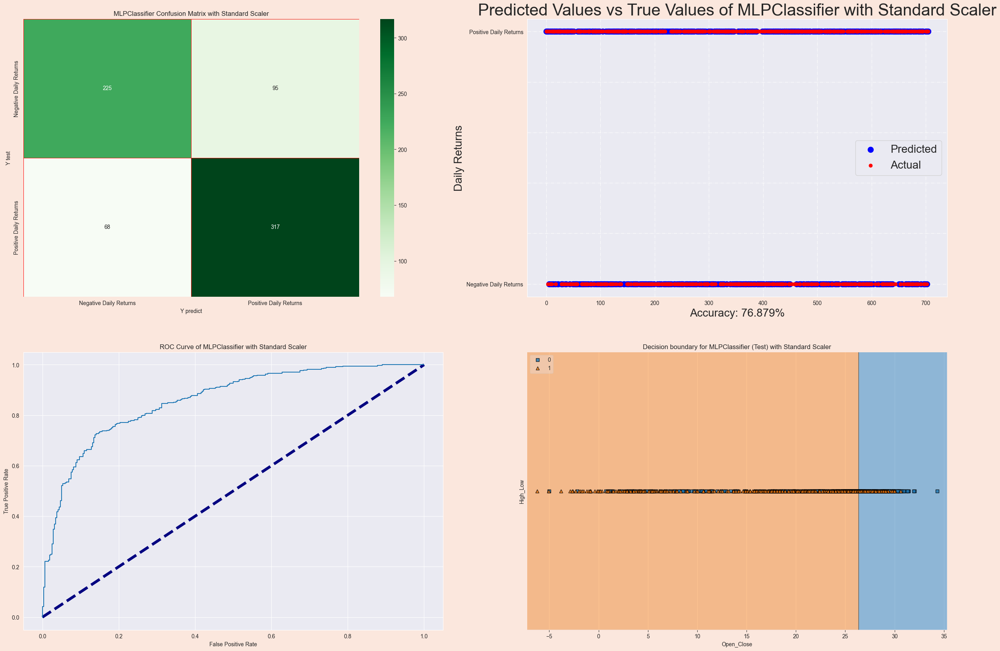

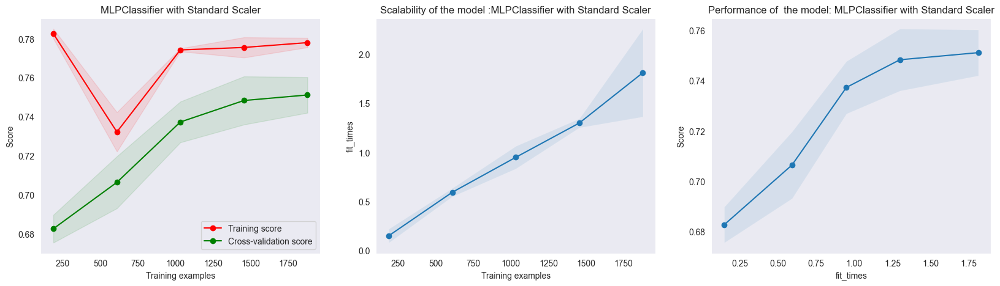

Feature Scaling: Standard Scaler - Prediction for tomorrow: 1


In [126]:
# Train and test models using different feature scaling methods
mlp = MLPClassifier(random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    # Run the model training and evaluation
    run_model('MLPClassifier', mlp, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(mlp, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Light Gradient Boosting Classifier

LGBMClassifier
Robust Scaler
[LightGBM] [Info] Number of positive: 1538, number of negative: 1279
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 2817, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.545971 -> initscore=0.184404
[LightGBM] [Info] Start training from score 0.184404


python(4634) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
accuracy:  0.7375886524822695
recall:  0.7375886524822695
precision:  0.7371159410787502
f1:  0.7362544694688198
              precision    recall  f1-score   support

           0       0.73      0.67      0.70       320
           1       0.74      0.79      0.77       385

    accuracy                           0.74       705
   macro avg       0.74      0.73      0.73       705
weighted avg       0.74      0.74      0.74       705

[LightGBM] [Info] Number of positive: 577, number of negative: 480
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `f

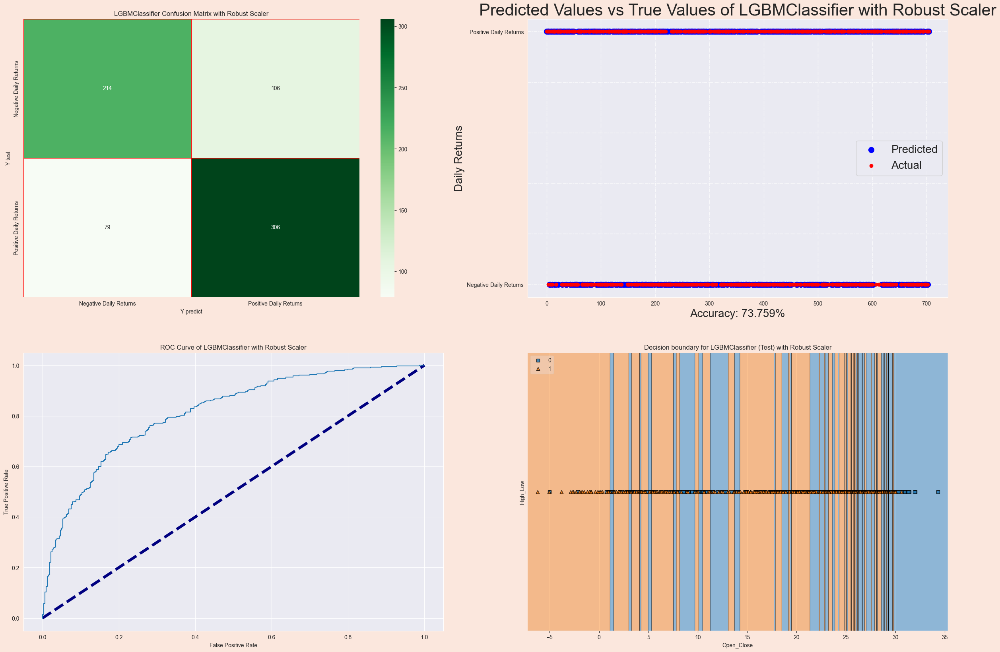

[LightGBM] [Info] Number of positive: 92, number of negative: 95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 957
[LightGBM] [Info] Number of data points in the train set: 187, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.491979 -> initscore=-0.032088
[LightGBM] [Info] Start training from score -0.032088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

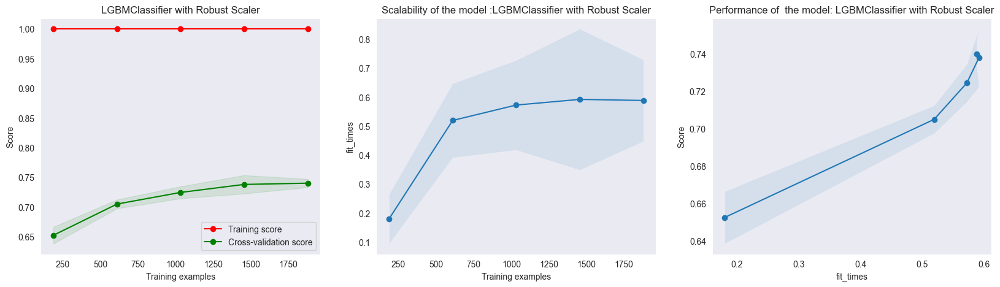

[LightGBM] [Info] Number of positive: 1923, number of negative: 1598
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 3521, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.546152 -> initscore=0.185134
[LightGBM] [Info] Start training from score 0.185134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

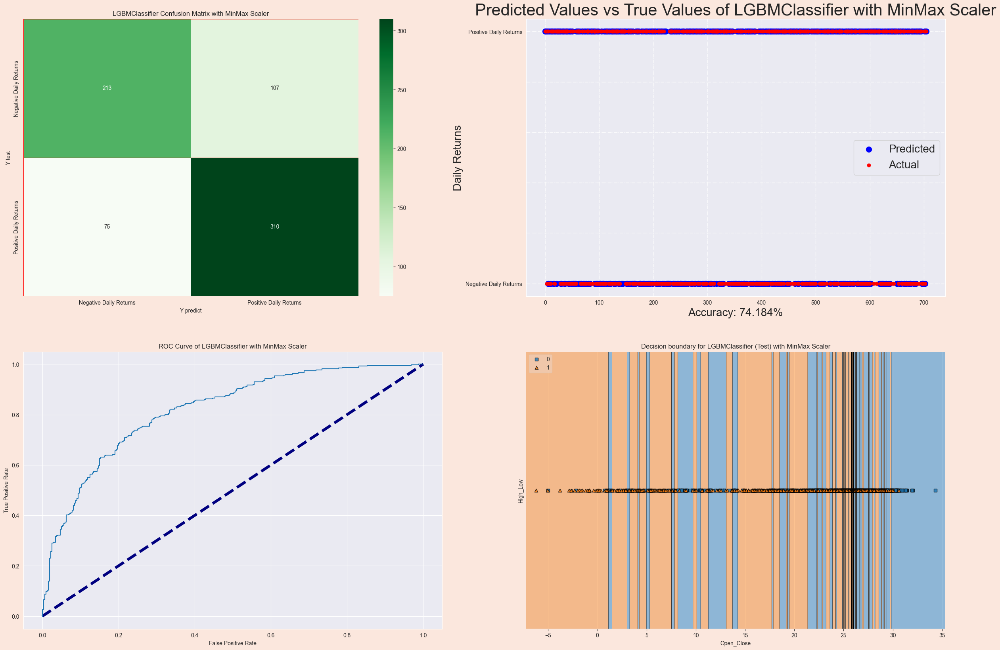

[LightGBM] [Info] Number of positive: 92, number of negative: 95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 955
[LightGBM] [Info] Number of data points in the train set: 187, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.491979 -> initscore=-0.032088
[LightGBM] [Info] Start training from score -0.032088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

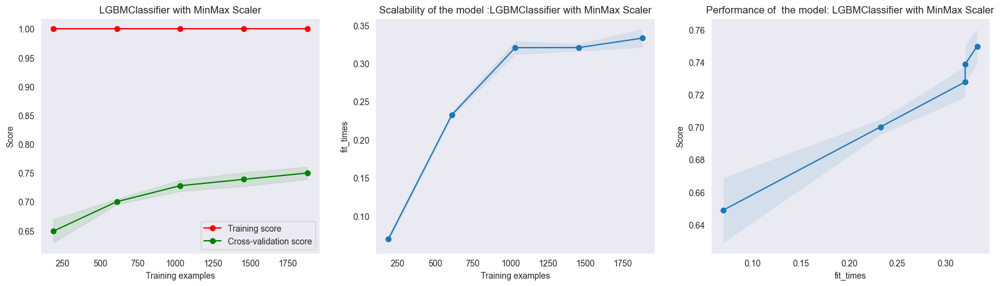

[LightGBM] [Info] Number of positive: 1923, number of negative: 1598
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 3521, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.546152 -> initscore=0.185134
[LightGBM] [Info] Start training from score 0.185134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

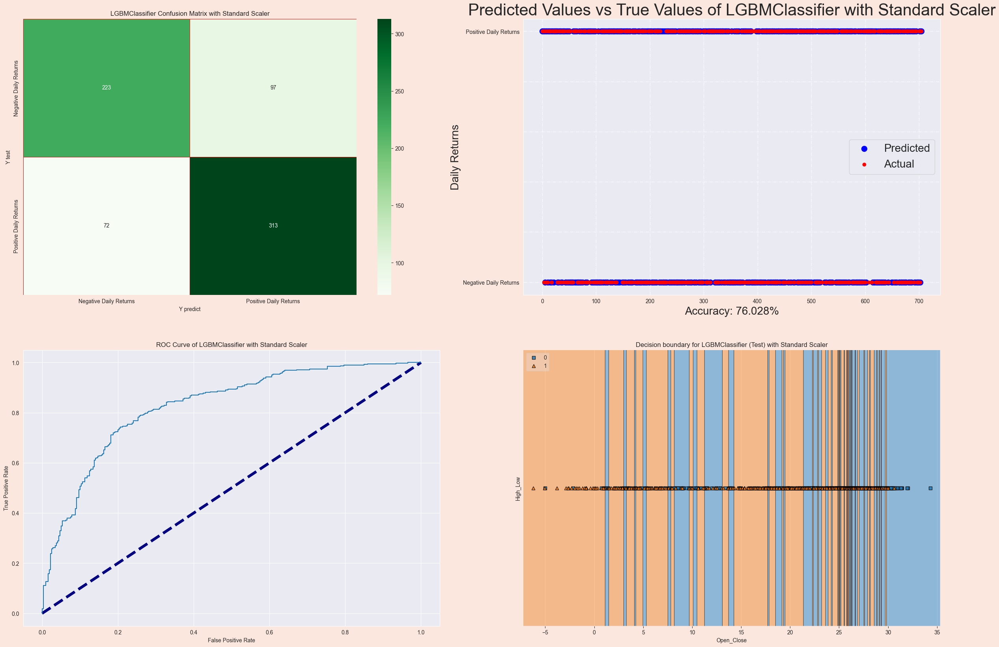

[LightGBM] [Info] Number of positive: 92, number of negative: 95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 956
[LightGBM] [Info] Number of data points in the train set: 187, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.491979 -> initscore=-0.032088
[LightGBM] [Info] Start training from score -0.032088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

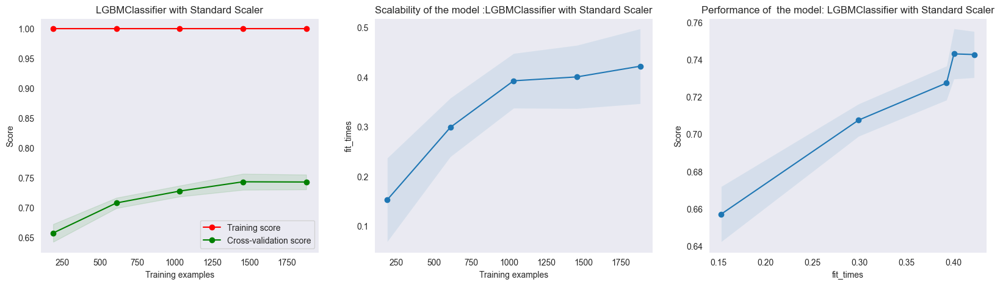

[LightGBM] [Info] Number of positive: 1923, number of negative: 1598
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 3521, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.546152 -> initscore=0.185134
[LightGBM] [Info] Start training from score 0.185134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [127]:
# Train and test models using different feature scaling methods
lgbm = LGBMClassifier(max_depth=20, n_estimators=500, subsample=0.8, random_state=2021)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    # Run the model training and evaluation
    run_model('LGBMClassifier', lgbm, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(lgbm, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Gaussian Mixture Model Classifier 

GaussianMixture
Robust Scaler
accuracy:  0.5049645390070922
recall:  0.5049645390070922
precision:  0.5116904460277129
f1:  0.5056759614867561
              precision    recall  f1-score   support

           0       0.46      0.53      0.49       320
           1       0.55      0.48      0.51       385

    accuracy                           0.50       705
   macro avg       0.51      0.51      0.50       705
weighted avg       0.51      0.50      0.51       705



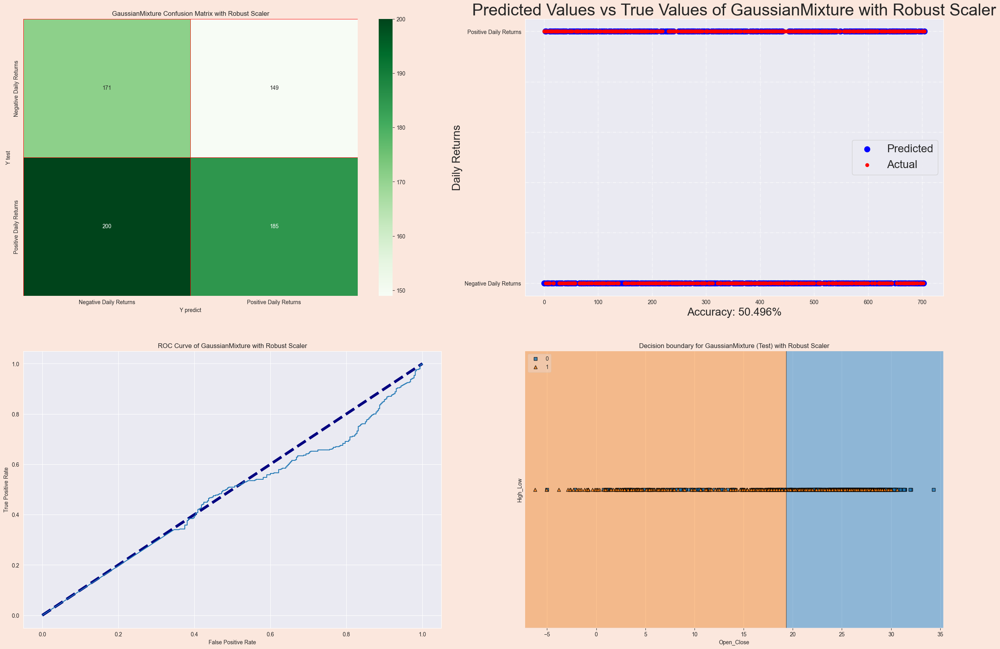

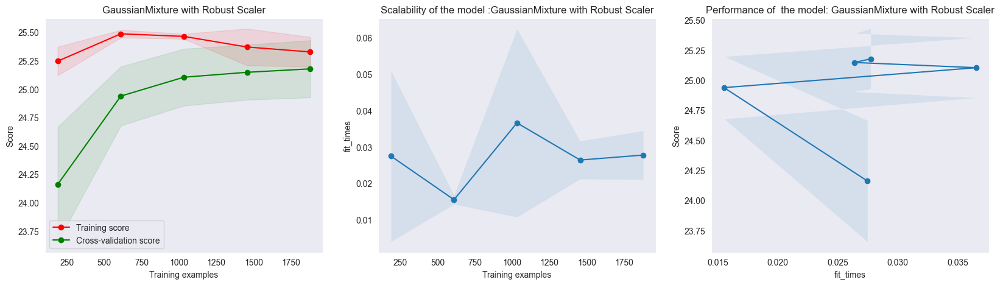

Feature Scaling: Robust Scaler - Prediction for tomorrow: 1
GaussianMixture
MinMax Scaler
accuracy:  0.5063829787234042
recall:  0.5063829787234042
precision:  0.5135312301596441
f1:  0.5069730494626986
              precision    recall  f1-score   support

           0       0.46      0.54      0.50       320
           1       0.56      0.48      0.51       385

    accuracy                           0.51       705
   macro avg       0.51      0.51      0.51       705
weighted avg       0.51      0.51      0.51       705



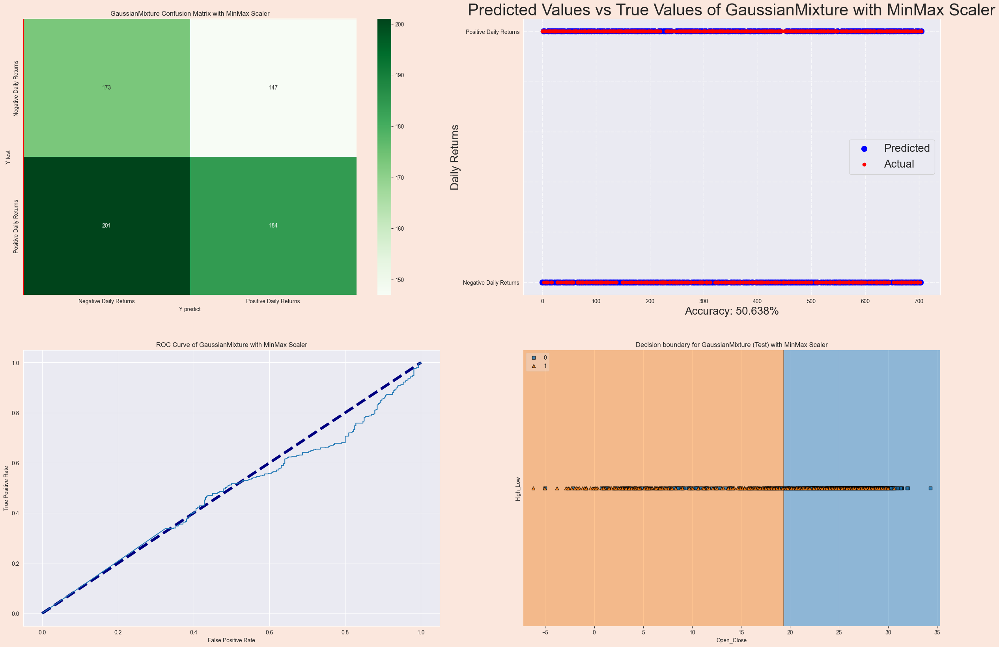

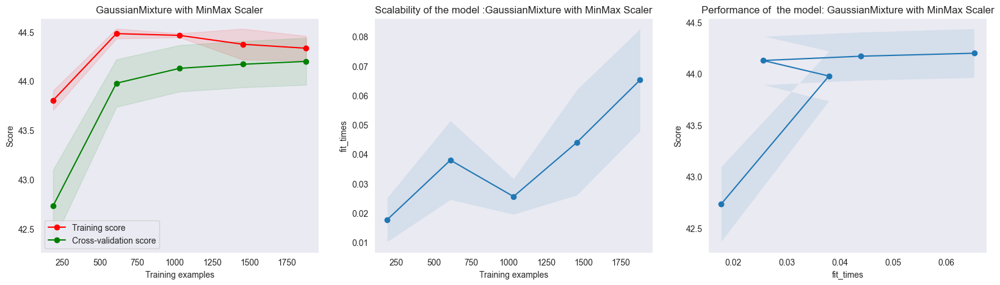

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 1
GaussianMixture
Standard Scaler
accuracy:  0.5092198581560283
recall:  0.5092198581560283
precision:  0.5152906347241644
f1:  0.5100835040896406
              precision    recall  f1-score   support

           0       0.46      0.53      0.50       320
           1       0.56      0.49      0.52       385

    accuracy                           0.51       705
   macro avg       0.51      0.51      0.51       705
weighted avg       0.52      0.51      0.51       705



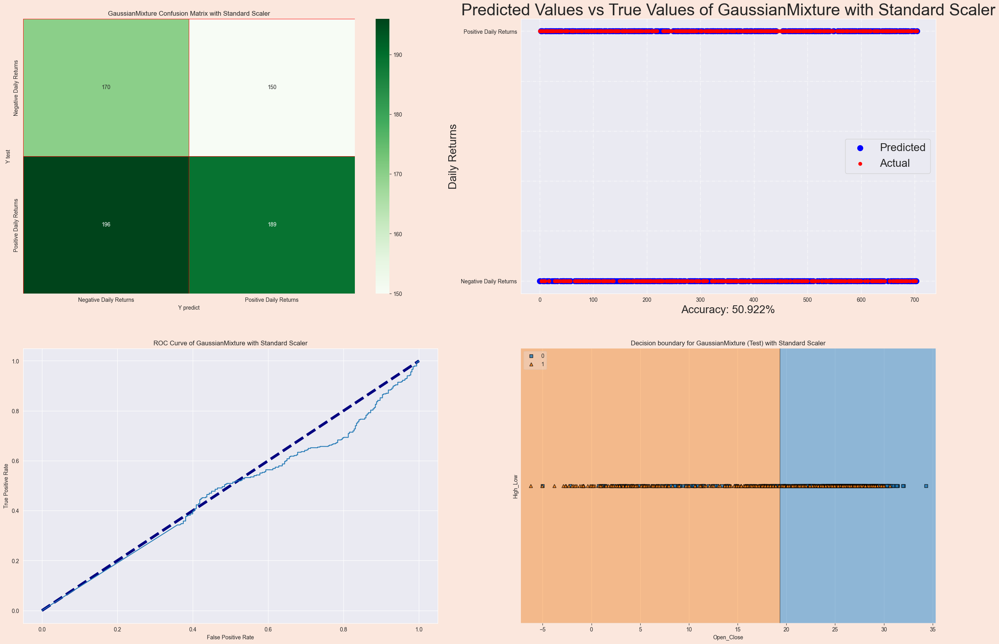

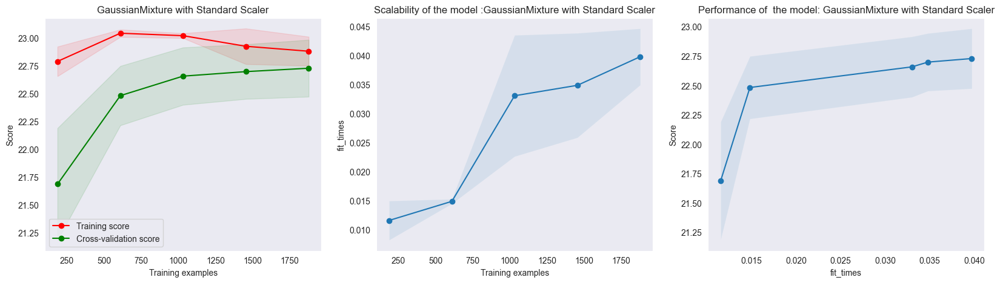

Feature Scaling: Standard Scaler - Prediction for tomorrow: 1


In [128]:

# Train and test models using different feature scaling methods
gm = GaussianMixture(n_components=2, random_state=100)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    # Run the model training and evaluation
    run_model('GaussianMixture', gm, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(gm, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### Extra Trees Classifier 

ExtraTreesClassifier
Robust Scaler
accuracy:  0.7134751773049646
recall:  0.7134751773049646
precision:  0.7128141458464434
f1:  0.7116512563309905
              precision    recall  f1-score   support

           0       0.70      0.63      0.67       320
           1       0.72      0.78      0.75       385

    accuracy                           0.71       705
   macro avg       0.71      0.71      0.71       705
weighted avg       0.71      0.71      0.71       705



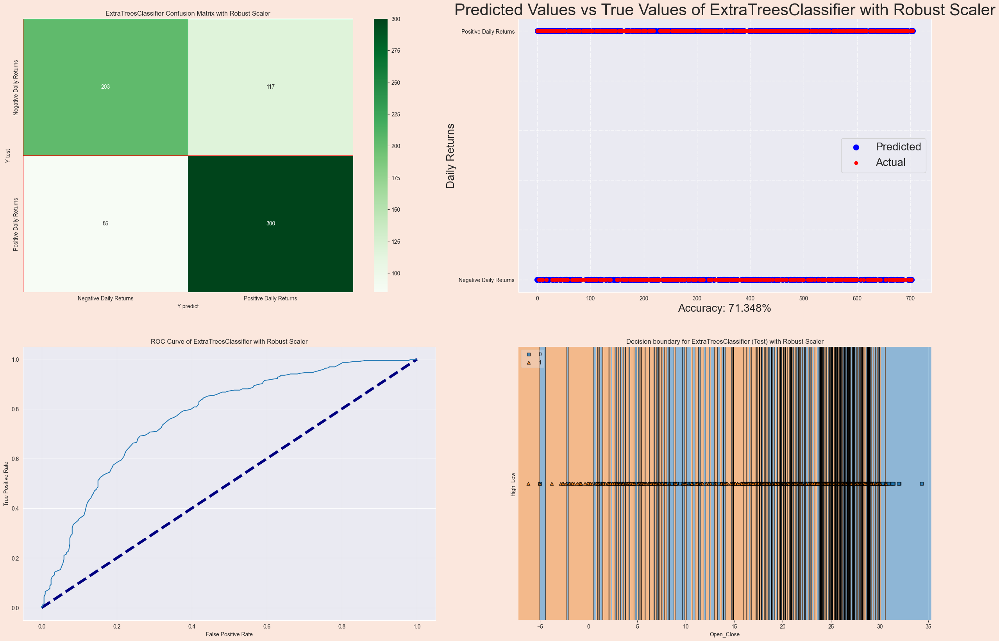

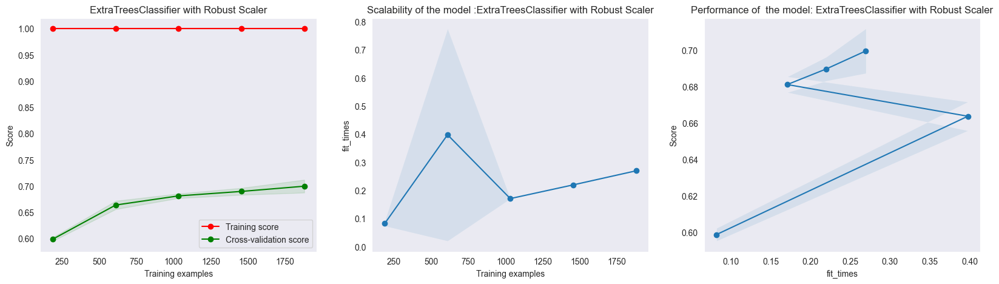

Feature Scaling: Robust Scaler - Prediction for tomorrow: 0
ExtraTreesClassifier
MinMax Scaler
accuracy:  0.7134751773049646
recall:  0.7134751773049646
precision:  0.7127503410560805
f1:  0.7118018253691432
              precision    recall  f1-score   support

           0       0.70      0.64      0.67       320
           1       0.72      0.78      0.75       385

    accuracy                           0.71       705
   macro avg       0.71      0.71      0.71       705
weighted avg       0.71      0.71      0.71       705



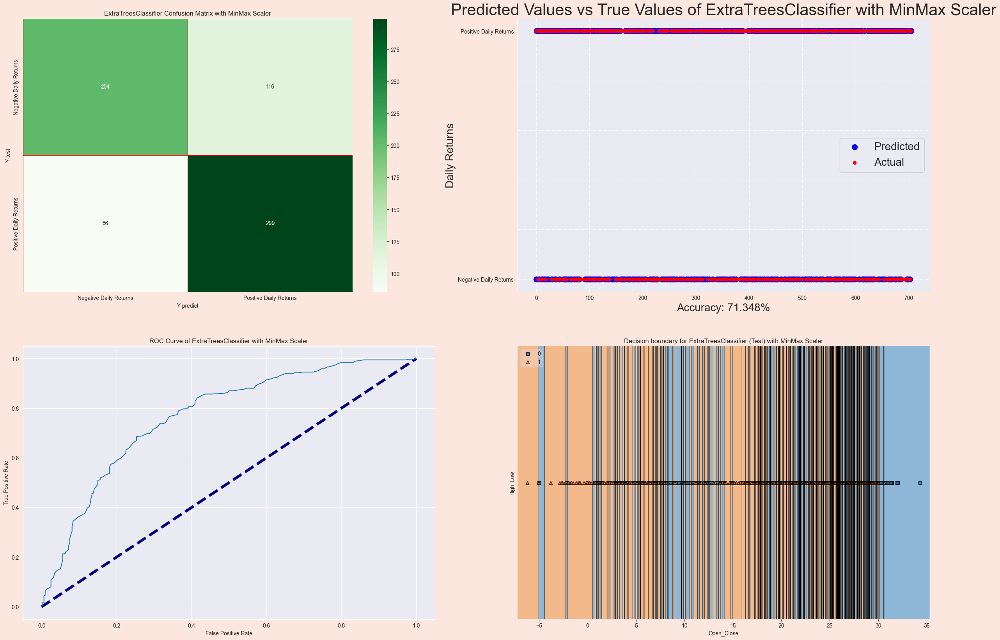

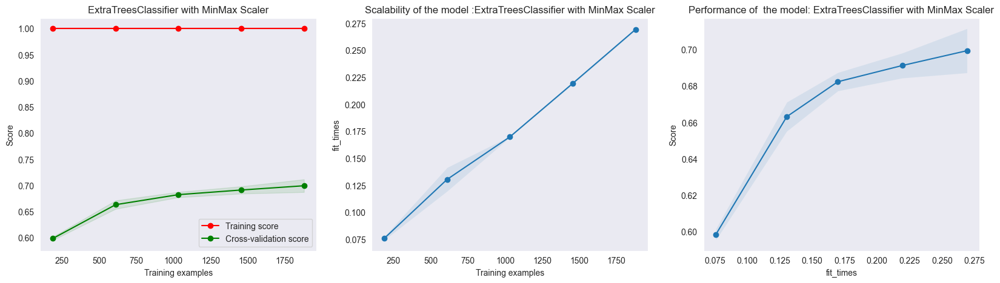

Feature Scaling: MinMax Scaler - Prediction for tomorrow: 0
ExtraTreesClassifier
Standard Scaler
accuracy:  0.7148936170212766
recall:  0.7148936170212766
precision:  0.7142954688225494
f1:  0.7130019585934427
              precision    recall  f1-score   support

           0       0.71      0.63      0.67       320
           1       0.72      0.78      0.75       385

    accuracy                           0.71       705
   macro avg       0.71      0.71      0.71       705
weighted avg       0.71      0.71      0.71       705



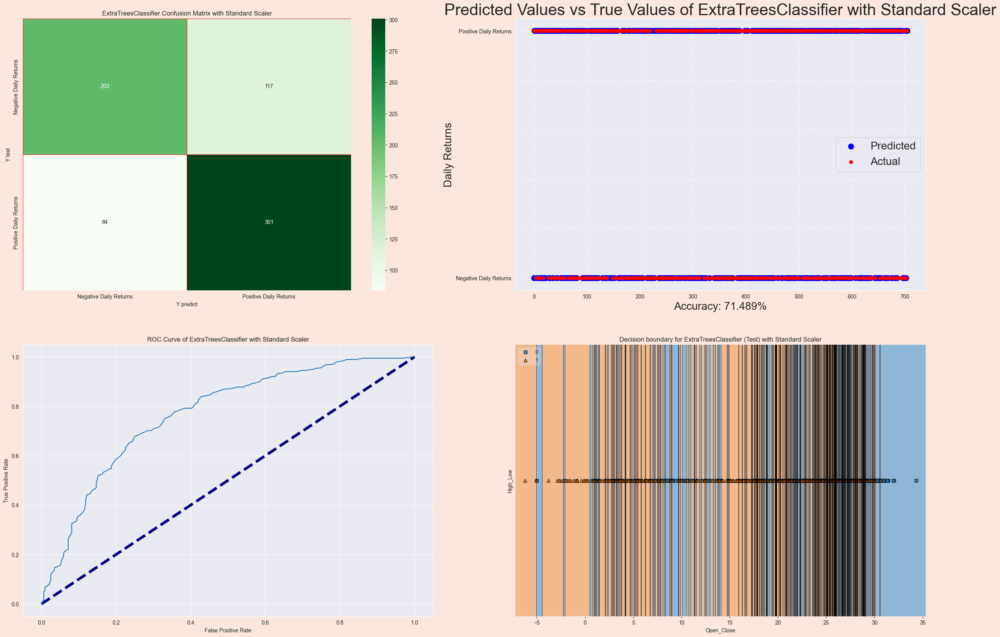

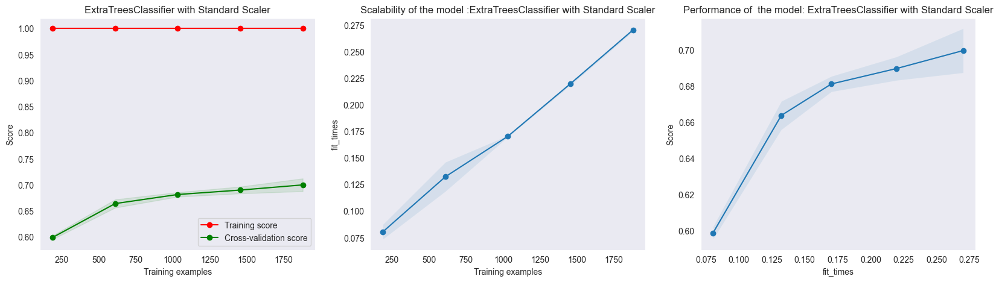

Feature Scaling: Standard Scaler - Prediction for tomorrow: 0


In [129]:
# Train and test models using different feature scaling methods
extra = ExtraTreesClassifier(n_estimators=200, random_state=100)

for fc_name, value in feature_scaling.items():
    X_train, X_test, y_train, y_test = value

    # Run the model training and evaluation
    run_model('ExtraTreesClassifier', extra, X_train, X_test, y_train, y_test, fc_name, proba=True)

    X_scaled_full = np.vstack((X_train, X_test))  # Rebuild full scaled dataset

    # Use the next_day_prediction function to predict tomorrow's outcome
    next_day_pred = next_day_prediction(extra, X_scaled_full, y)
    
    print(f"Feature Scaling: {fc_name} - Prediction for tomorrow: {next_day_pred}")

### LSTM and GRU

In [130]:
def create_sequences(X, y, time_steps=30):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:i+time_steps])
        y_seq.append(y[i+time_steps])
    return np.array(X_seq), np.array(y_seq)

# Example of creating sequences
time_steps = 30  # You can adjust this
X_seq, y_seq = create_sequences(X_scaled_full, y, time_steps)

# Split the sequences into train and test sets
X_train_seq, X_test_seq, y_train_seq, y_test_seq = train_test_split(X_seq, y_seq, test_size=0.2, random_state=2021, stratify=y_seq)

In [131]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout

# Define LSTM model
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))  # For binary classification
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define GRU model
def build_gru_model(input_shape):
    model = Sequential()
    model.add(GRU(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(GRU(50))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))  # For binary classification
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [132]:
# Train and evaluate LSTM or GRU models
def train_lstm_gru(model, X_train_seq, y_train_seq, X_test_seq, y_test_seq, epochs=10, batch_size=32):
    history = model.fit(X_train_seq, y_train_seq, epochs=epochs, batch_size=batch_size, validation_data=(X_test_seq, y_test_seq))
    return history

# Initialize LSTM and GRU models
input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])  # (time_steps, features)
lstm_model = build_lstm_model(input_shape)
gru_model = build_gru_model(input_shape)

# Train LSTM
print("Training LSTM...")
lstm_history = train_lstm_gru(lstm_model, X_train_seq, y_train_seq, X_test_seq, y_test_seq)

# Train GRU
print("Training GRU...")
gru_history = train_lstm_gru(gru_model, X_train_seq, y_train_seq, X_test_seq, y_test_seq)

Training LSTM...
Epoch 1/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5352 - loss: 0.6950 - val_accuracy: 0.5465 - val_loss: 0.6891
Epoch 2/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5401 - loss: 0.6913 - val_accuracy: 0.5451 - val_loss: 0.6894
Epoch 3/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5390 - loss: 0.6900 - val_accuracy: 0.5451 - val_loss: 0.6896
Epoch 4/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5346 - loss: 0.6908 - val_accuracy: 0.5451 - val_loss: 0.6884
Epoch 5/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5272 - loss: 0.6907 - val_accuracy: 0.5451 - val_loss: 0.6878
Epoch 6/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5463 - loss: 0.6889 - val_accuracy: 0.5479 - val_loss: 0.6885
Epoch 7/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5462 - loss: 0.6876 - val_accuracy: 0.5465 - val_loss: 0.6875
Epoch 8/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5491 - loss: 0.6868 - val_acc

In [133]:
# Get the last sequence from the dataset for the next-day prediction
last_sequence = X_scaled_full[-time_steps:].reshape(1, time_steps, X_scaled_full.shape[1])

# Predict using LSTM
lstm_next_day_pred = lstm_model.predict(last_sequence)
lstm_next_day_pred = (lstm_next_day_pred > 0.5).astype(int)  # Threshold for binary classification

# Predict using GRU
gru_next_day_pred = gru_model.predict(last_sequence)
gru_next_day_pred = (gru_next_day_pred > 0.5).astype(int)

print(f"LSTM Prediction for tomorrow: {lstm_next_day_pred[0][0]}")
print(f"GRU Prediction for tomorrow: {gru_next_day_pred[0][0]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
LSTM Prediction for tomorrow: 1
GRU Prediction for tomorrow: 1
